Mahjong tile classifier built with Tensor, with tranfer learning from MobilenetV2. The data set consist of 700 centerer Mahjong images, in 42 classes. Majority of the data set isfrom https://github.com/Camerash/mahjong-dataset, with minor amendments and addition of ~80 images.

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import linear, relu, sigmoid
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
import pandas as pd
import seaborn as sns
from PIL import Image
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, f1_score
import cv2
import os
import re
import math

## Exploratory Data Analysis

### Checking label, label name and image-name in data.csv

Import from data.csv, which consist the image name, corresponding label and label name, name dataframe as mj_df

In [2]:
mj_df = pd.read_csv("data.csv")
print('Shape of data:', mj_df.shape)

display(mj_df.head())

Shape of data: (700, 3)


,image-name,label,label-name
0,1.jpg,38,bonus-winter
1,2.jpg,26,characters-8
2,3.jpg,9,dots-9
3,4.jpg,36,bonus-summer
4,5.jpg,28,honors-east



It is noted that the "image-name" and "label-name" are with hyphen, change them to underscore to prevent error when calling df.XXX-XXX

In [3]:
mj_df = mj_df.rename(columns=lambda x: re.sub('-', '_', x))
mj_df = mj_df.rename(columns={'label': 'label_id'})

Afterwards, add a new column of image path to mj_df

In [4]:
image_path = os.path.join('images','{}')
mj_df['image_path'] = mj_df['image_name'].apply(lambda x :image_path.format(x))
mj_df.head()

,image_name,label_id,label_name,image_path
0,1.jpg,38,bonus-winter,images\1.jpg
1,2.jpg,26,characters-8,images\2.jpg
2,3.jpg,9,dots-9,images\3.jpg
3,4.jpg,36,bonus-summer,images\4.jpg
4,5.jpg,28,honors-east,images\5.jpg


Check if the data is consistent, including label and label_name

Text(0.5, 1.0, 'Label Name')

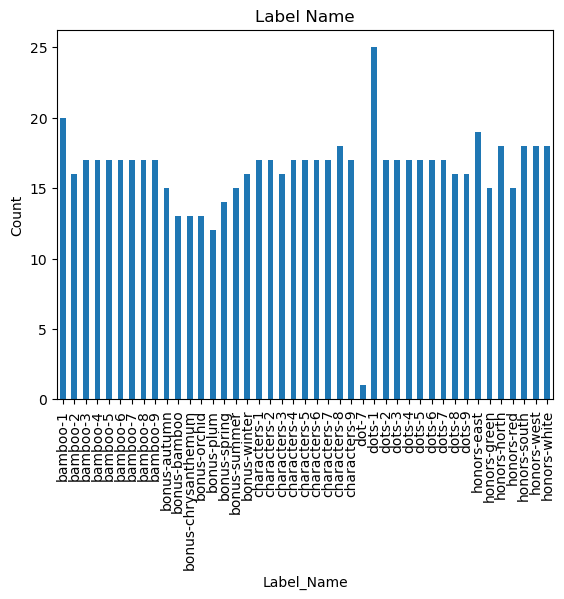

In [5]:
df_barchart = mj_df['label_name'].value_counts().sort_index()
df_barchart.plot.bar()
plt.ylabel("Count",fontsize=10)
plt.xlabel("Label_Name",fontsize=10)
plt.title("Label Name")

It is noted that there is a typo in one of the label_name, instead of "dot-7" it should be "dots-7", replace accordingly

In [6]:
mj_df['label_name'] = mj_df['label_name'].replace({'dot-7': 'dots-7'})

Text(0.5, 0, 'Label_Name')

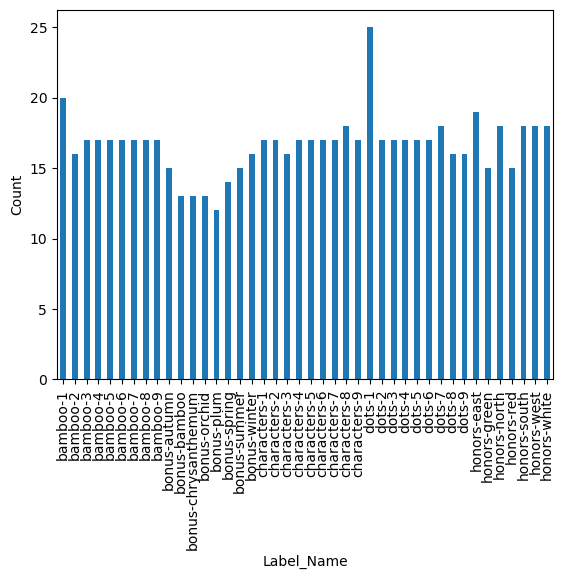

In [7]:
df_barchart = mj_df['label_name'].value_counts().sort_index()
df_barchart.plot.bar()
plt.ylabel("Count",fontsize=10)
plt.xlabel("Label_Name",fontsize=10)

Looking good, next check if there's any error for numeric labels.

Text(0.5, 1.0, 'Label ID')

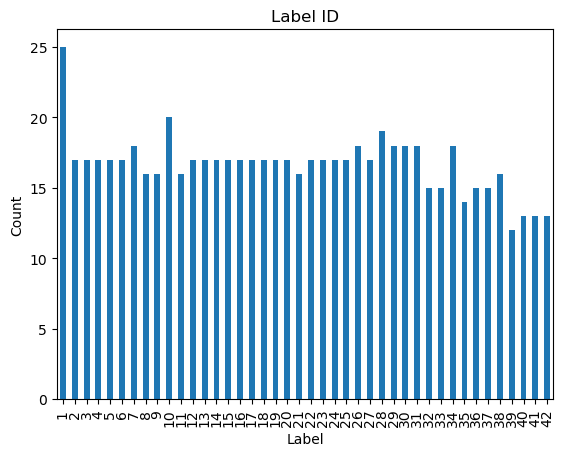

In [8]:
df_barchart = mj_df['label_id'].value_counts().sort_index()
df_barchart.plot.bar()
plt.ylabel("Count",fontsize=10)
plt.xlabel("Label",fontsize=10)
plt.title("Label ID")

It is noted the label starts at 1 instead of 0, subtract 1 from labels to facilitate classification by tensorflow later.

In [9]:
mj_df['label_id'] -= 1
mj_df.head()
print('mj_df Label starts at:', min(mj_df['label_id']), 'after subtract.')


mj_df Label starts at: 0 after subtract.


Then check if the label and label_name are unique pair.

In [10]:
mj_df.groupby(['label_id', 'label_name']).size()

label_id  label_name         
0         dots-1                 25
1         dots-2                 17
2         dots-3                 17
3         dots-4                 17
4         dots-5                 17
5         dots-6                 17
6         dots-7                 18
7         dots-8                 16
8         dots-9                 16
9         bamboo-1               20
10        bamboo-2               16
11        bamboo-3               17
12        bamboo-4               17
13        bamboo-5               17
14        bamboo-6               17
15        bamboo-7               17
16        bamboo-8               17
17        bamboo-9               17
18        characters-1           17
19        characters-2           17
20        characters-3           16
21        characters-4           17
22        characters-5           17
23        characters-6           17
24        characters-7           17
25        characters-8           18
26        characters-9           1

The label and label name pairs are unique, set num_classes as unique labels (42 classes)

In [11]:
num_classes = mj_df['label_id'].nunique()
print(num_classes, 'number of classes')

42 number of classes


### Loading and preprocessing of images

Afterwards, we would like to load the images into a list with cv2, at the same time check the aspect ratio of the photos.
Since data augmentation would be performed, the images shall be in same aspect ratio for image resize.

In [12]:
images= []
for index, row in mj_df[['image_path']].iterrows():
    img = cv2.imread(row[0], cv2.IMREAD_UNCHANGED)
    height, width = img.shape[:2]
    # Save the dimensions to a new column in the DataFrame
    mj_df.loc[index, 'width'] = width
    mj_df.loc[index, 'height'] = height
    if img is not None:
        images.append(img)
#calculate the image aspect ratio
mj_df['ratio'] = mj_df['width']/mj_df['height']

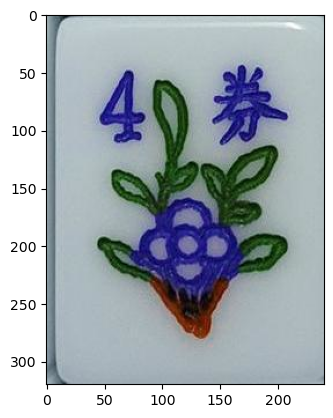

In [13]:
#Display of sample image
plt.imshow(images[0].astype("uint8"))

Most of the images have aspect ratio of 3:4, hence try to find ones that are not 3:4.

In [14]:
mj_df[mj_df['ratio'] != 0.75]

,image_name,label_id,label_name,image_path,width,height,ratio
640,641.jpg,28,honors-south,images\641.jpg,136.0,184.0,0.739130
687,688.jpg,39,bonus-orchid,images\688.jpg,89.0,116.0,0.767241


Noting two of the images don't have a ratio of 0.75, amend to size to allow uniform resize in data augmentation

In [15]:
images[640] = images[640][0:180, 0:135]
mj_df.loc[640, 'width'] = 135
mj_df.loc[640, 'height'] = 180
images[688] = images[688][0:116, 0:87]
mj_df.loc[688, 'width'] = 87
mj_df.loc[688, 'height'] = 116
print('shape of images[640]:',images[640].shape[:2])
print('shape of images[688]:',images[688].shape[:2])
mj_df['ratio'] = mj_df['width']/mj_df['height']

shape of images[640]: (180, 135)
shape of images[688]: (116, 87)


In [16]:
mj_df.loc[[640,688]]

,image_name,label_id,label_name,image_path,width,height,ratio
640,641.jpg,28,honors-south,images\641.jpg,135.0,180.0,0.75
688,689.jpg,40,bonus-chrysanthemum,images\689.jpg,87.0,116.0,0.75


### Spot checking of images in each class

Now we will display the first few images from the same label, to get a sense of our data.

Int64Index([ 92, 103, 112, 122, 172, 197, 248, 295, 337, 373, 415, 428, 429,
            430, 431, 502, 540, 582, 583, 584, 585, 627, 656, 674, 675],
           dtype='int64')


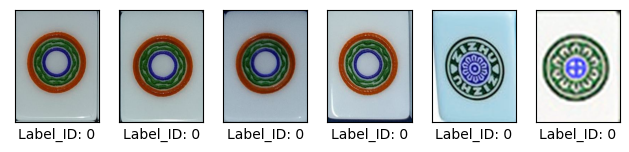

Int64Index([ 18,  61,  78, 126, 171, 193, 227, 292, 336, 370, 412, 436, 499,
            537, 579, 624, 657],
           dtype='int64')


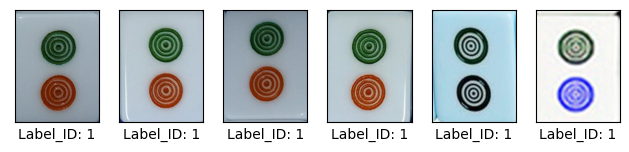

Int64Index([15, 16, 22, 46, 170, 189, 237, 289, 335, 367, 409, 437, 496, 534,
            576, 621, 658],
           dtype='int64')


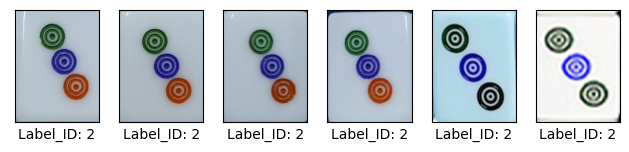

Int64Index([ 62,  66, 104, 119, 169, 184, 249, 286, 334, 364, 406, 438, 493,
            531, 573, 618, 659],
           dtype='int64')


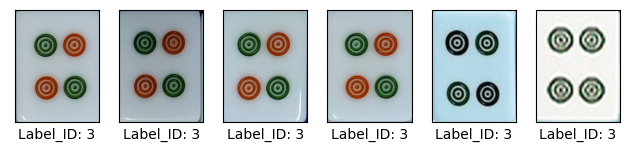

Int64Index([57, 76, 86, 90, 168, 183, 228, 283, 333, 361, 403, 439, 490, 528,
            570, 615, 660],
           dtype='int64')


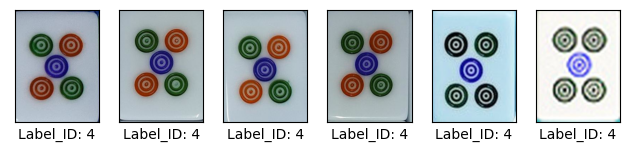

Int64Index([ 26,  47,  60, 111, 167, 196, 238, 280, 332, 358, 400, 420, 487,
            525, 567, 612, 661],
           dtype='int64')


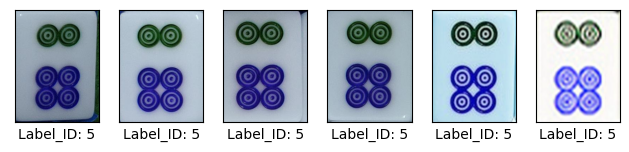

Int64Index([ 25,  45,  89, 101, 166, 192, 250, 277, 331, 355, 397, 421, 484,
            522, 564, 609, 628, 662],
           dtype='int64')


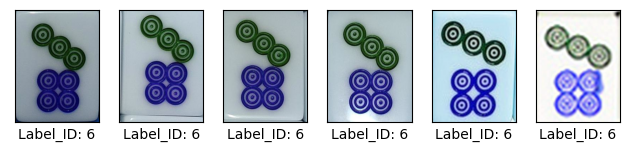

Int64Index([75, 129, 165, 188, 239, 274, 330, 349, 352, 393, 422, 481, 519,
            561, 606, 663],
           dtype='int64')


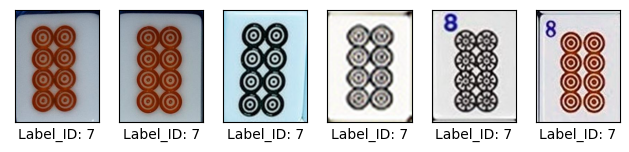

Int64Index([2, 12, 123, 127, 164, 182, 254, 271, 329, 391, 423, 478, 516, 558,
            603, 664],
           dtype='int64')


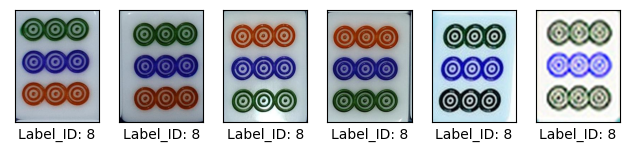

Int64Index([ 31,  51,  64,  73, 163, 199, 259, 294, 304, 372, 414, 452, 501,
            539, 581, 626, 643, 665, 676, 677],
           dtype='int64')


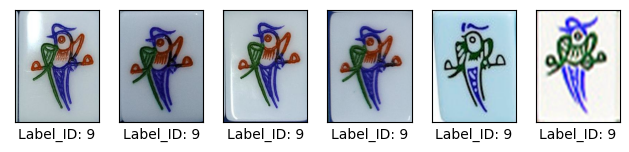

Int64Index([68, 130, 137, 162, 195, 231, 291, 303, 369, 411, 457, 498, 536,
            578, 623, 666],
           dtype='int64')


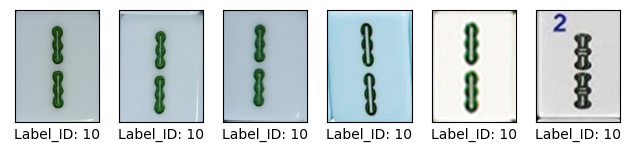

Int64Index([ 29,  54,  77, 133, 161, 191, 243, 288, 298, 366, 408, 458, 495,
            533, 575, 620, 667],
           dtype='int64')


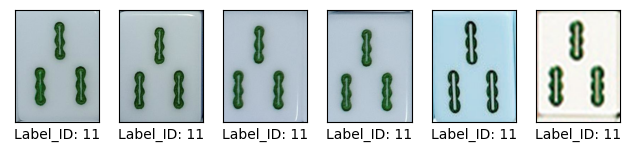

Int64Index([ 69,  70,  87, 117, 160, 187, 241, 285, 297, 363, 405, 459, 492,
            530, 572, 617, 668],
           dtype='int64')


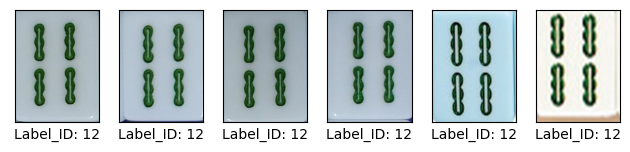

Int64Index([ 95,  97, 105, 134, 159, 186, 233, 282, 302, 360, 402, 460, 489,
            527, 569, 614, 669],
           dtype='int64')


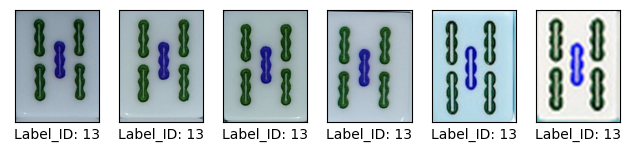

Int64Index([ 59,  72,  79, 100, 158, 198, 230, 279, 301, 357, 399, 447, 486,
            524, 566, 611, 670],
           dtype='int64')


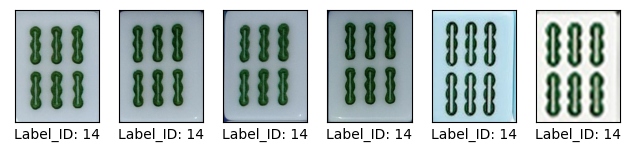

Int64Index([7, 28, 71, 124, 157, 194, 240, 276, 300, 354, 396, 448, 483, 521,
            563, 608, 671],
           dtype='int64')


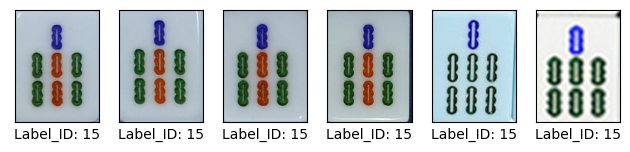

Int64Index([ 58,  74, 113, 114, 156, 190, 229, 273, 299, 351, 394, 449, 480,
            518, 560, 605, 672],
           dtype='int64')


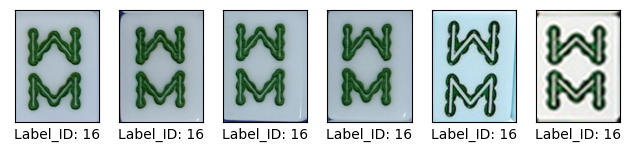

Int64Index([ 83,  85, 107, 120, 155, 185, 255, 270, 296, 348, 390, 450, 477,
            515, 557, 602, 673],
           dtype='int64')


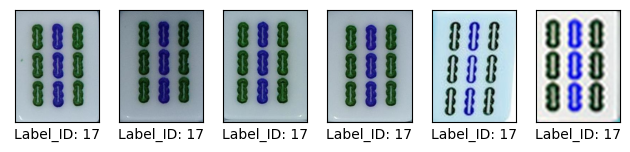

Int64Index([ 44,  50,  55, 121, 181, 223, 224, 293, 328, 371, 413, 451, 500,
            538, 580, 625, 647],
           dtype='int64')


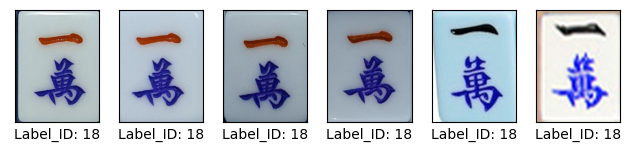

Int64Index([ 10,  65,  88, 106, 180, 217, 234, 290, 327, 368, 410, 453, 497,
            535, 577, 622, 648],
           dtype='int64')


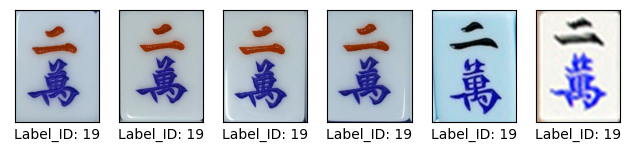

Int64Index([48, 82, 84, 179, 213, 245, 287, 326, 365, 407, 454, 494, 532, 574,
            619, 649],
           dtype='int64')


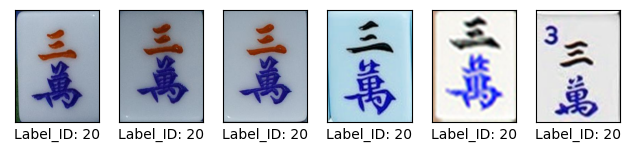

Int64Index([17, 20, 35, 91, 178, 206, 225, 284, 325, 362, 404, 455, 491, 529,
            571, 616, 650],
           dtype='int64')


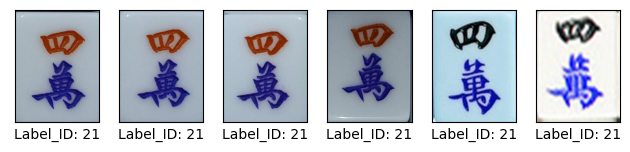

Int64Index([ 13,  21,  42, 118, 177, 222, 235, 281, 324, 359, 401, 456, 488,
            526, 568, 613, 651],
           dtype='int64')


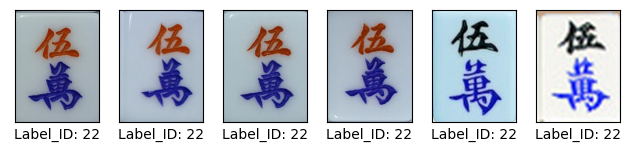

Int64Index([6, 41, 53, 128, 176, 221, 246, 278, 323, 356, 398, 443, 485, 523,
            565, 610, 652],
           dtype='int64')


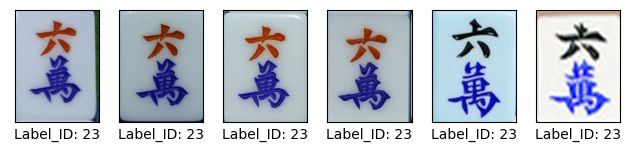

Int64Index([ 24,  30, 131, 136, 175, 216, 226, 275, 322, 353, 395, 444, 482,
            520, 562, 607, 653],
           dtype='int64')


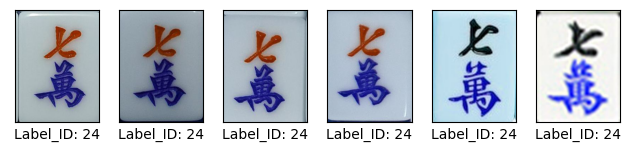

Int64Index([  1,  11,  39, 132, 174, 212, 236, 272, 321, 350, 392, 445, 479,
            517, 559, 604, 654, 678],
           dtype='int64')


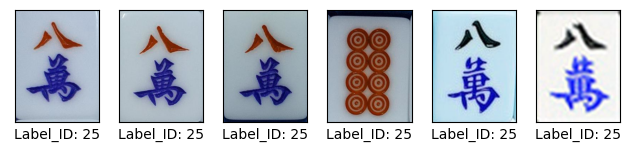

Int64Index([ 40,  99, 102, 116, 173, 205, 247, 269, 320, 347, 389, 446, 476,
            514, 556, 601, 655],
           dtype='int64')


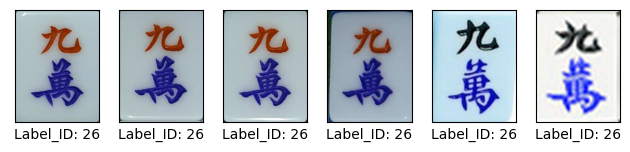

Int64Index([  4,  63, 109, 139, 146, 220, 242, 268, 319, 346, 387, 432, 474,
            512, 554, 599, 630, 639, 696],
           dtype='int64')


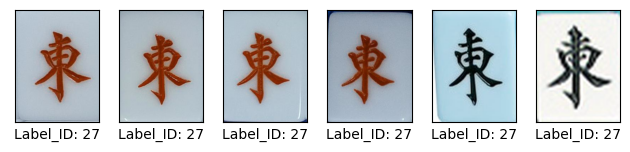

Int64Index([ 19,  23,  81, 110, 145, 215, 232, 266, 318, 345, 384, 433, 471,
            509, 551, 596, 640, 697],
           dtype='int64')


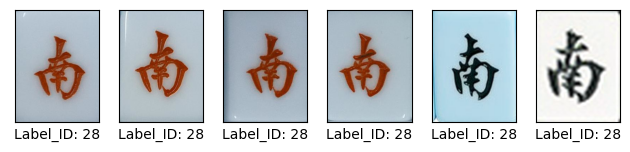

Int64Index([  9,  37,  67,  98, 144, 211, 257, 267, 317, 344, 386, 434, 473,
            511, 550, 598, 641, 698],
           dtype='int64')


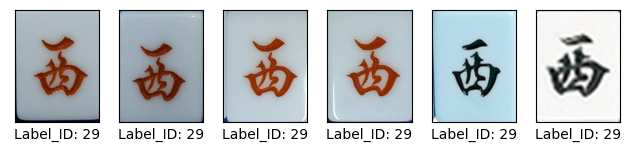

Int64Index([  8,  14,  52,  80, 143, 204, 258, 264, 316, 338, 383, 418, 470,
            508, 553, 595, 642, 699],
           dtype='int64')


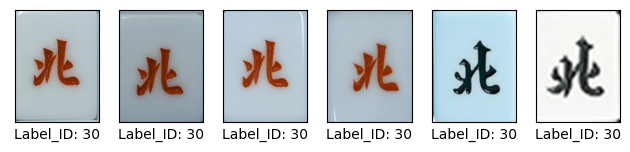

Int64Index([32, 43, 56, 115, 142, 219, 315, 388, 416, 475, 513, 555, 600, 644,
            693],
           dtype='int64')


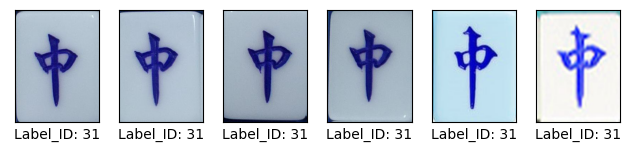

Int64Index([27, 49, 108, 125, 141, 218, 314, 385, 417, 472, 510, 552, 597, 645,
            695],
           dtype='int64')


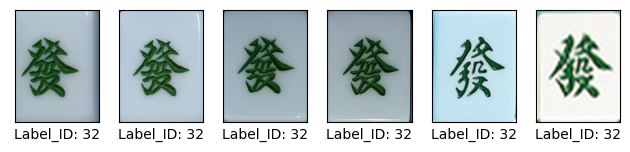

Int64Index([ 34,  38,  93,  96, 140, 214, 244, 265, 313, 339, 382, 427, 469,
            507, 549, 594, 646, 694],
           dtype='int64')


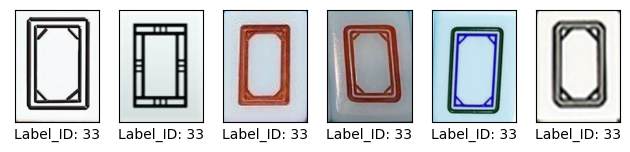

Int64Index([135, 154, 210, 256, 260, 312, 340, 381, 426, 468, 544, 589, 638,
            683],
           dtype='int64')


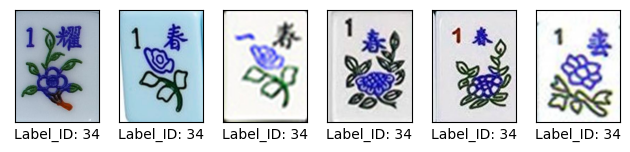

Int64Index([3, 153, 209, 253, 261, 311, 342, 380, 425, 467, 543, 588, 637, 684,
            690],
           dtype='int64')


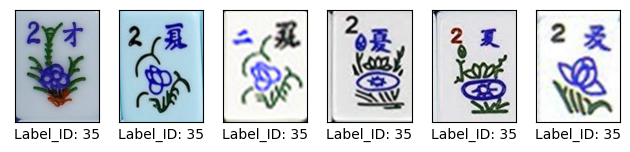

Int64Index([5, 152, 208, 252, 262, 310, 341, 379, 424, 466, 542, 587, 636, 685,
            691],
           dtype='int64')


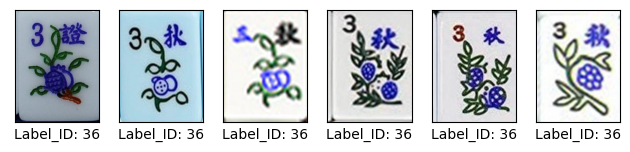

Int64Index([0, 151, 207, 251, 263, 309, 343, 378, 419, 465, 541, 586, 629, 635,
            686, 692],
           dtype='int64')


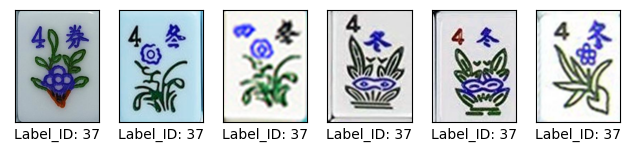

Int64Index([36, 150, 203, 308, 377, 442, 464, 506, 548, 593, 634, 679], dtype='int64')


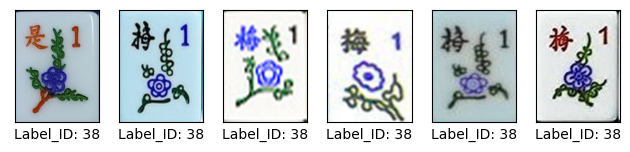

Int64Index([138, 149, 202, 307, 376, 441, 463, 505, 547, 592, 633, 680, 687], dtype='int64')


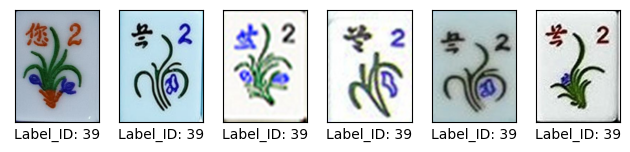

Int64Index([33, 147, 201, 306, 375, 440, 462, 504, 546, 591, 632, 681, 688], dtype='int64')


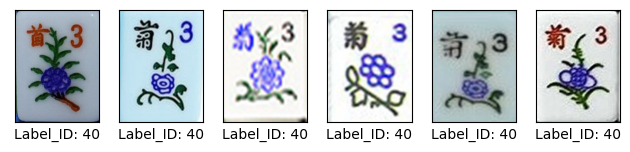

Int64Index([94, 148, 200, 305, 374, 435, 461, 503, 545, 590, 631, 682, 689], dtype='int64')


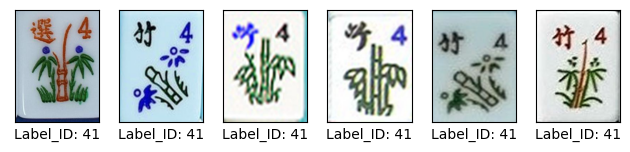

In [17]:
img_arr_withlabel = []
label_arr = np.array(mj_df['label_id'])
for label_id in range(42):
    img_index = mj_df.index[mj_df['label_id'] == label_id]
    print(img_index)
    for i, index in enumerate(img_index[:6]):
        plt.subplot(1, 6, i+1)
        plt.imshow(images[index].astype("uint8"))
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        #label is a batch of 16 one-hot encoded feature, get the first one from the batch
        plt.xlabel('Label_ID: '+ str(label_id))
        plt.tight_layout()
    plt.show()


Few observations were made:
1. Wrong label discovered for label_id 25, image with index 132 should have a label_id of 7 instead of 25.
2. Tiles of label_id 34-41 could vary a lot, hence affecting the accuracy of classification in upcoming tasks.

As such, we will revise the label of index 132.

In [18]:
mj_df.loc[132,['label_id', 'label_name']] = [7, 'dots-8']

In [19]:
label = np.array(mj_df['label_id'])

In [20]:
#Set the image height, image width and number of classes for tensor/
img_height = 224
img_width = 224
num_classes = mj_df['label_id'].nunique()

## Train test split

Split the data set into 80% train/val and 20% test set, by index. Since each label has limited number of sample (e.g. for label 38 bonus-plum  there's only 12 samples), it is preferred to use stratified train/test split.

Size of train set: (560,)
Size of test set: (140,)


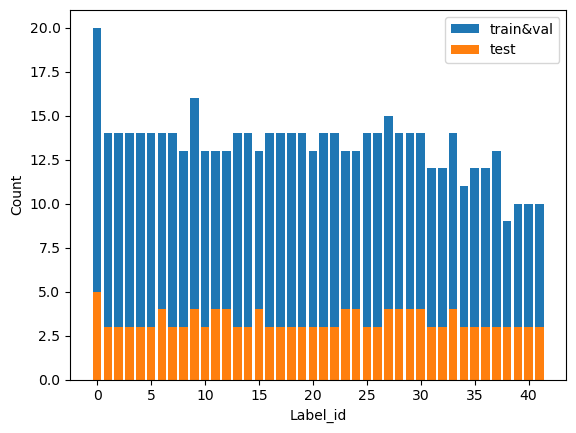

In [21]:
indices_trainval, indices_test = train_test_split(np.arange(label.shape[0]), test_size=0.2, random_state=42, stratify=label)
#check size of train set
print('Size of train set:',indices_trainval.shape)
print('Size of test set:',indices_test.shape)
plt.tight_layout()
bin_edges = np.arange(num_classes+1)

# Plot histograms of the train/val and test sets
plt.hist(label[indices_trainval], label="train&val", bins=bin_edges, align='left', rwidth=0.8)
plt.hist(label[indices_test], label="test", bins=bin_edges, align='left', rwidth=0.8)

plt.xticks(bin_edges[::5])

# Set the axis labels and legend
plt.ylabel('Count')
plt.xlabel('Label_id')
plt.legend(loc=1)

# Show the plot
plt.show()

# Tensor model setup

### Create base model with Mobilenet V2

In [22]:
AUTOTUNE = tf.data.AUTOTUNE

In [23]:
#Specifying the include_top=False argument, so that the network doesn't include the classification layers at the top
base_model = tf.keras.applications.MobileNetV2(input_shape=(img_height, img_width, 3),
                                               include_top=False,
                                               weights='imagenet')


In [24]:
#Set base_model as not trainable, which prevents the weights in a given layer from being updated during training, to allow extraction of features
base_model.trainable = False

In [25]:
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  154


### Define classification layer, second last layer (Conv2D), and input processing/ augmentation

In [26]:
#Use tf.keras.layers.GlobalAveragePooling2D layer to convert the features to a single vector per image
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()


In [27]:
#Convert features into a single prediction per image,with 42 classes
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')


In [28]:
#Define data normalization with tf.keras.applications.mobilenet_v2.preprocess_input and data augmentation
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

#Convert features into a single prediction per image,with 42 classes
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')

#Use tf.keras.layers.GlobalAveragePooling2D layer to convert the features to a single vector per image
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

data_augmentation = tf.keras.Sequential([
    layers.RandomRotation(0.5),
    layers.RandomBrightness(0.5),
    layers.RandomContrast(0.3),
    layers.RandomFlip("horizontal_and_vertical"),  
    layers.RandomTranslation(height_factor = (-0.2,0), width_factor = 0.2, fill_mode = 'nearest')
])

In [29]:
inputs = tf.keras.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)
print(x.shape)
      
x = preprocess_input(x)
print(x.shape)

x = base_model(x, training=False)
print(x.shape)

x = global_average_layer(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


## Training the output layer and final layers

In [30]:
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                             

### Model Output Layer Training

In [33]:
#Create checkpoint for callback
checkpoint_path = "training_fold/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [34]:
#Set batch size to 16 to speed up training
batch_size = 16

In [35]:
def read_image(image_path):
    '''Get image from image_path with tf.image.decode_image'''
    return tf.image.decode_image(tf.io.read_file(image_path), channels=3, expand_animations=False)

In [36]:
def get_Xy(indices):
    '''Get X (image_path) and y (label_id) from the index array'''
    X = mj_df.loc[indices]['image_path']
    y = mj_df.loc[indices]['label_id']
    return X,y

In [37]:
def resize(image):
    '''Resize image to designated size (224x224x3) for tensorflow's process'''
    image = tf.image.resize(image, (img_width, img_height), method='nearest')
    return image

In [38]:
def get_ds(indices):
    '''Get tensor ds from input index, 1. get_Xy; 2. read_image, resize on image_ds; 3. get one-hot label_ds; 4. zip for ds'''
    X, y = get_Xy(indices)
    
    image_ds = tf.data.Dataset.from_tensor_slices(X)
    image_ds = image_ds.map(read_image, num_parallel_calls=AUTOTUNE)
    image_ds = image_ds.map(resize, num_parallel_calls=AUTOTUNE)
    
    label_ds = tf.keras.utils.to_categorical(y, num_classes=None, dtype='float32')
    label_ds = tf.data.Dataset.from_tensor_slices(label_ds)
    
    ds = tf.data.Dataset.zip((image_ds, label_ds)).batch(batch_size)
    ds = ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
    
    return ds

Train test 1 has (448,) no of entries.
Train test 2 has (448,) no of entries.
Train test 3 has (448,) no of entries.
Train test 4 has (448,) no of entries.
Train test 5 has (448,) no of entries.


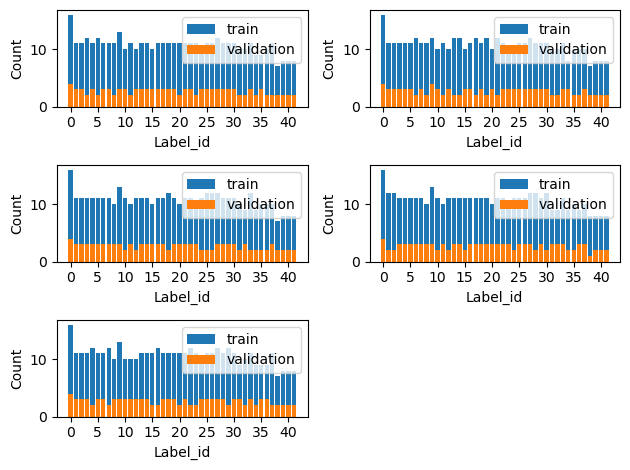

In [39]:
n= 0
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=320)

for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    X_train, y_train = get_Xy(train_index)
    X_val, y_val = get_Xy(val_index)
    n += 1
    print('Train test', n, 'has', X_train.shape ,'no of entries.')
    plt.subplot(3, 2, n)
    
    bin_edges = np.arange(num_classes+1)
    plt.hist(y_train, label="train", bins = bin_edges, align='left', rwidth=0.8)
    plt.hist(y_val, label="validation", bins = bin_edges, align='left', rwidth=0.8)
    plt.xticks(bin_edges[::5])

    # Set the axis labels and legend
    plt.ylabel('Count')
    plt.xlabel('Label_id')
    plt.legend(loc=1)

# Show the plot
plt.tight_layout()
plt.show()

In [38]:
model.save_weights('model.h5')

In [39]:
total_epochs = 0
acc = []
val_acc = []
loss = []
val_loss = []
acc_tuple = ()
loss_tuple = ()
acc_performance =[]
loss_performance = []

fold = 0


In [40]:
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    train_ds = get_ds(train_index)
    val_ds = get_ds(val_index)

    model.reset_states()
    model.load_weights('model.h5')
    
    epochs = 20
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-{fold}.hdf5", save_best_only=True, save_weights_only=True)
    
    print("Fold", fold, "training")
    
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = epochs,
                        callbacks=[cp_callback]
                        )
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_performance.append(loss_tuple)

    fold += 1

Fold 0 training
Epoch 1/20
28/28 [==============================] - 29s 528ms/step - loss: 3.7896 - accuracy: 0.0938 - val_loss: 3.0505 - val_accuracy: 0.2054
Epoch 2/20
28/28 [==============================] - 13s 479ms/step - loss: 2.5296 - accuracy: 0.3036 - val_loss: 2.4040 - val_accuracy: 0.3214
Epoch 3/20
28/28 [==============================] - 13s 479ms/step - loss: 2.0203 - accuracy: 0.4330 - val_loss: 2.0850 - val_accuracy: 0.4018
Epoch 4/20
28/28 [==============================] - 14s 490ms/step - loss: 1.7024 - accuracy: 0.5089 - val_loss: 1.8857 - val_accuracy: 0.4554
Epoch 5/20
28/28 [==============================] - 13s 480ms/step - loss: 1.4337 - accuracy: 0.5915 - val_loss: 1.7635 - val_accuracy: 0.4821
Epoch 6/20
28/28 [==============================] - 14s 503ms/step - loss: 1.4021 - accuracy: 0.5893 - val_loss: 1.6384 - val_accuracy: 0.5357
Epoch 7/20
28/28 [==============================] - 14s 516ms/step - loss: 1.2052 - accuracy: 0.6562 - val_loss: 1.5474 - val_

### Model Evaluation

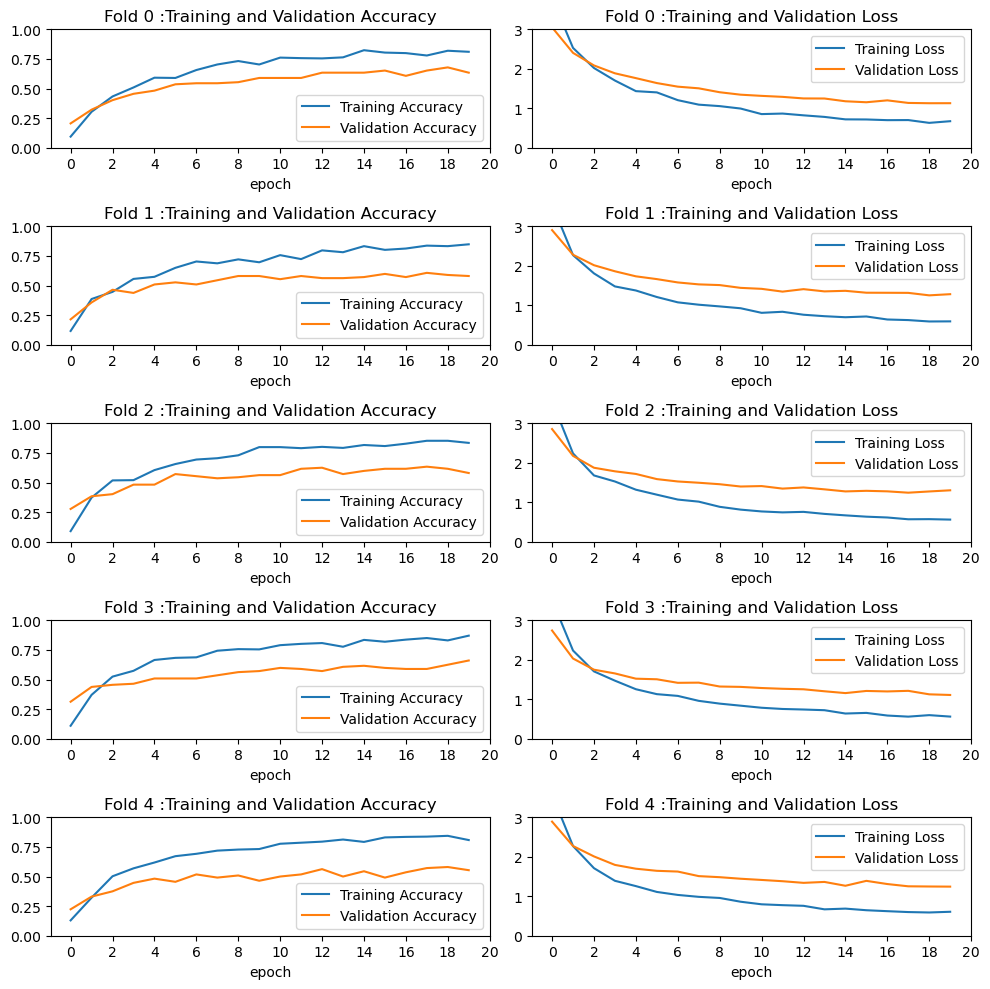

In [42]:
fig, ax = plt.subplots(5, 2, figsize=(10, 10))

for i in range(5):

    ax[i, 0].plot(acc_performance[i][1], label='Training Accuracy')
    ax[i, 0].plot(acc_performance[i][2], label='Validation Accuracy')
    ax[i, 0].set_ylim([0, 1])
    ax[i, 0].legend(loc='lower right')
    ax[i, 0].set_xlabel('epoch')
    ax[i, 0].set_xticks(np.arange(0, len(acc_performance[i][1])+1,2))
    title = 'Fold {} :Training and Validation Accuracy'.format(i)
    ax[i, 0].set_title(title)
    
    ax[i, 1].plot(loss_performance[i][1], label='Training Loss')
    ax[i, 1].plot(loss_performance[i][2], label='Validation Loss')
    ax[i, 1].set_ylim([0, 3.0])
    ax[i, 1].legend(loc='upper right')
    ax[i, 1].set_xlabel('epoch')
    ax[i, 1].set_xticks(np.arange(0, len(acc_performance[i][1])+1,2))
    title = 'Fold {} :Training and Validation Loss'.format(i)
    ax[i, 1].set_title(title)
    

plt.tight_layout()
plt.show()
    
    

By training the output layer and second last layer only, it is noted that the model successfully improve in training accuracy, but the model demonstrated overfitting and accuracy has not improved. Let's also try to train the base model to see if the performance is improved.

## Revised model with base model training

In [43]:
#Set base model to trainable, and check the number of layers in base model
base_model.trainable = True
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 80

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


In [44]:
inputs = tf.keras.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)
print(x.shape)

x = preprocess_input(x)
print(x.shape)

x = base_model(x, training=False)
print(x.shape)

x = global_average_layer(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


In [45]:
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                           

In [46]:
total_epochs = 0
acc = []
val_acc = []
loss = []
val_loss = []
acc_tuple = ()
loss_tuple = ()
acc_performance =[]
loss_performance = []

fold = 0


In [47]:
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    train_ds = get_ds(train_index)
    val_ds = get_ds(val_index)
    
#Output layers training
    base_model.trainable = False
    base_learning_rate = 0.001   
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )    
    
    model.reset_states()
    model.load_weights('model.h5')
   
    total_epochs = 0
    
    epochs = 20
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-{fold}.hdf5", save_best_only=True, save_weights_only=True)
    
    print('Fold {} output layers training'.format(fold))
    
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = epochs,
                        callbacks=[cp_callback]
                        )

    total_epochs += epochs
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_performance.append(loss_tuple)
    

#Base model layer training

#Set base model to trainable
    base_model.trainable = True

    # Fine-tune from this layer onwards
    fine_tune_at = 80

    # Freeze all the layers before the `fine_tune_at` layer
    for layer in base_model.layers[:fine_tune_at]:
      layer.trainable = False

    #Compile to model again
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
    
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-fine-{fold}.hdf5", save_best_only=True, save_weights_only=True)


    print('Fold {} base model training'.format(fold))

    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = total_epochs + epochs,
                        initial_epoch = total_epochs,
                        callbacks=[cp_callback]
                        )
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_performance.append(loss_tuple)
    
    fold += 1

Fold 0 output layers training
Epoch 1/20
28/28 [==============================] - 27s 557ms/step - loss: 3.7803 - accuracy: 0.0781 - val_loss: 3.0655 - val_accuracy: 0.2143
Epoch 2/20
28/28 [==============================] - 14s 503ms/step - loss: 2.5724 - accuracy: 0.3058 - val_loss: 2.3635 - val_accuracy: 0.3571
Epoch 3/20
28/28 [==============================] - 20s 718ms/step - loss: 1.9935 - accuracy: 0.4509 - val_loss: 2.1411 - val_accuracy: 0.4107
Epoch 4/20
28/28 [==============================] - 17s 605ms/step - loss: 1.7253 - accuracy: 0.4799 - val_loss: 1.9126 - val_accuracy: 0.4375
Epoch 5/20
28/28 [==============================] - 21s 776ms/step - loss: 1.5045 - accuracy: 0.5625 - val_loss: 1.7319 - val_accuracy: 0.4911
Epoch 6/20
28/28 [==============================] - 14s 502ms/step - loss: 1.2858 - accuracy: 0.6339 - val_loss: 1.6644 - val_accuracy: 0.5357
Epoch 7/20
28/28 [==============================] - 19s 681ms/step - loss: 1.2355 - accuracy: 0.6339 - val_loss:

Make a df to better visualize the performance of model collected.

In [48]:
acc_df = pd.DataFrame(acc_performance)
acc_df.set_axis(['fold', 'train_acc', 'val_acc'], axis=1, inplace=True)
acc_df

,fold,train_acc,val_acc
0,0,"[0.078125, 0.3058035671710968, 0.4508928656578...","[0.2142857164144516, 0.3571428656578064, 0.410..."
1,0,"[0.6116071343421936, 0.6964285969734192, 0.792...","[0.4910714328289032, 0.6339285969734192, 0.651..."
2,1,"[0.0892857164144516, 0.3191964328289032, 0.439...","[0.1785714328289032, 0.3214285671710968, 0.383..."
3,1,"[0.6473214030265808, 0.7633928656578064, 0.808...","[0.6428571343421936, 0.6160714030265808, 0.687..."
4,2,"[0.09375, 0.2857142984867096, 0.45982143282890...","[0.2142857164144516, 0.3571428656578064, 0.419..."
5,2,"[0.65625, 0.8169642686843872, 0.78348213434219...","[0.5625, 0.6517857313156128, 0.633928596973419..."
6,3,"[0.0848214253783226, 0.3080357015132904, 0.410...","[0.2767857015132904, 0.4107142984867096, 0.419..."
7,3,"[0.5848214030265808, 0.7611607313156128, 0.812...","[0.5803571343421936, 0.5357142686843872, 0.696..."
8,4,"[0.0982142835855484, 0.3236607015132904, 0.453...","[0.2589285671710968, 0.3660714328289032, 0.392..."
9,4,"[0.6205357313156128, 0.7433035969734192, 0.803...","[0.5803571343421936, 0.5625, 0.660714268684387..."


The first row of each fold is the accuracy before base model training, whereas the second row is training the base model as well.

In [40]:
def performance_to_list(performance):
    '''Gather performance history and append to a list'''
    df = pd.DataFrame(performance)
    df.set_axis(['fold', 'train_acc', 'val_acc'], axis=1, inplace=True)
    fold = 0
    performance_lst = []
    for fold in range(5):
        fold_lst = []
        train = df[df['fold'] == fold].iloc[0][1] + df[df['fold'] == fold].iloc[1][1]
        val= df[df['fold'] == fold].iloc[0][2] + df[df['fold'] == fold].iloc[1][2]
        fold_lst = [train, val]
        performance_lst.append(fold_lst)
    return performance_lst

In [50]:
acc_lst = performance_to_list(acc_performance)
loss_lst = performance_to_list(loss_performance)

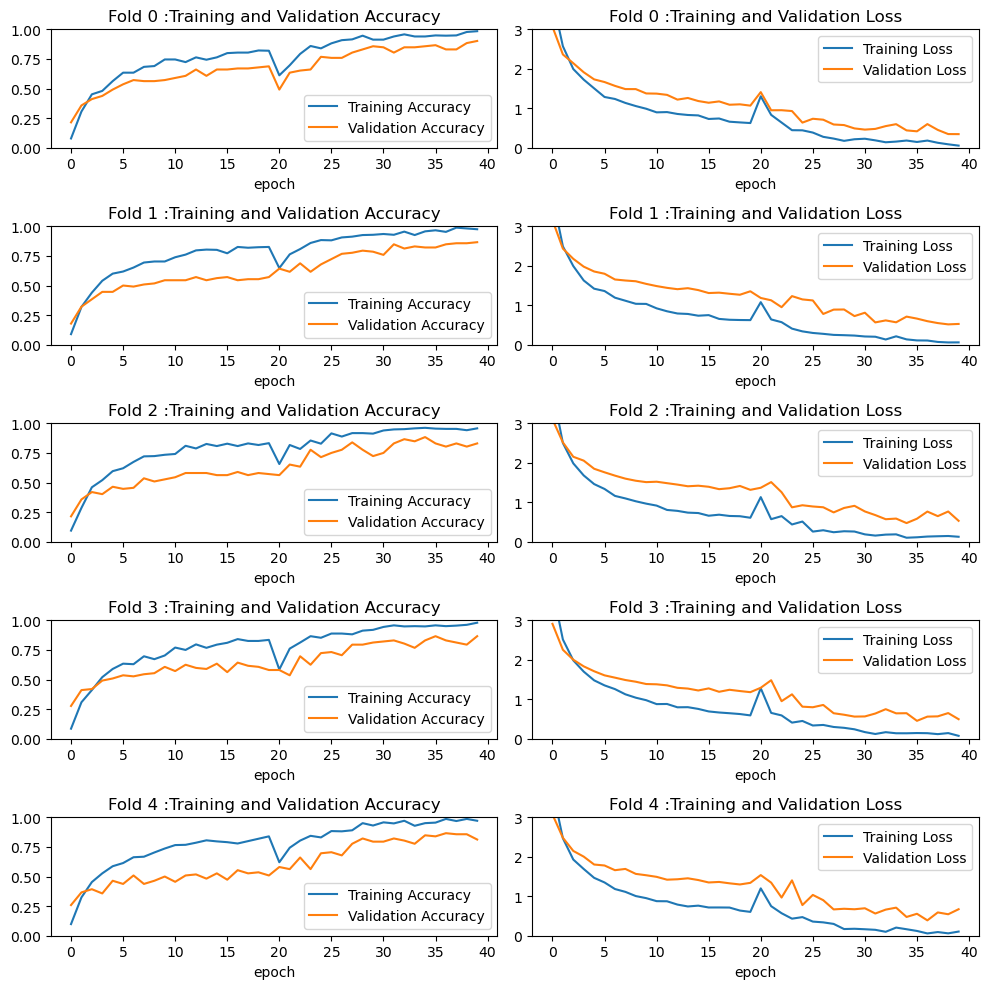

In [51]:
fig, ax = plt.subplots(5, 2, figsize=(10, 10))

for i in range(5):

    ax[i, 0].plot(acc_lst[i][0], label='Training Accuracy')
    ax[i, 0].plot(acc_lst[i][1], label='Validation Accuracy')
    ax[i, 0].set_ylim([0, 1])
    ax[i, 0].legend(loc='lower right')
    title = 'Fold {} :Training and Validation Accuracy'.format(i)
    ax[i, 0].set_title(title)
    ax[i, 0].set_xlabel('epoch')
    
    ax[i, 1].plot(loss_lst[i][0], label='Training Loss')
    ax[i, 1].plot(loss_lst[i][1], label='Validation Loss')
    ax[i, 1].set_ylim([0, 3.0])
    ax[i, 1].legend(loc='upper right')
    title = 'Fold {} :Training and Validation Loss'.format(i)
    ax[i, 1].set_title(title)
    ax[i, 1].set_xlabel('epoch')

plt.tight_layout()
plt.show()
    
    

### Error Analysis on the models

In [41]:
def get_Xy_ds(indices):
    '''Get tensor ds from input index, 1. get_Xy; 2. read_image, resize on image_ds; 3. get one-hot label_ds; but does not shuffle or zip'''
    X, y = get_Xy(indices)
    
    image_ds = tf.data.Dataset.from_tensor_slices(X)
    image_ds = image_ds.map(read_image, num_parallel_calls=AUTOTUNE)
    image_ds = image_ds.map(resize, num_parallel_calls=AUTOTUNE)
    image_ds = image_ds.cache().prefetch(buffer_size=AUTOTUNE).batch(batch_size)
    
    label_ds = label[indices]

    return image_ds, label_ds

In [42]:
#extract_worst_f1 on for getting image array and label array of input df with label and index
def get_f1_set (cr_df, f1_thresold, indices):
    '''Function to return (img_arr_f1, label_arr_f1, num_img), with given cr_df from classification report, f1-score thresold and corresponding indices'''
    global f1_list
    
    #Get the list of label_id with f1-score lower than thresold
    f1_list = cr_df.iloc[:-3].index[cr_df['f1-score'].iloc[:-3] < f1_thresold].astype("uint8").tolist()
    print('Worst performing labels with f1-scocre <',f1_thresold,'are:', f1_list)
   
    #Get the corresponding image indices of labels that performed poorly.
    df = pd.DataFrame(data = [label[indices], indices], index =['label', 'index']).T
    df = df[df['label'].isin(f1_list)].sort_values('label')
    print('List of labels and corresponding index in data set:')
    display(df)
    
    img_lst_f1 = []
    label_lst_f1 = []
    
    #Append all images (those with f1-score < thresold) to list img_lst_f1
    for index in df['index']:
        img_lst_f1.append(images[index])
    img_arr_f1 = np.array(img_lst_f1, dtype=object)
    print('No. of images in test set  with f1-scocre <',f1_thresold, img_arr_f1.shape[0])
    
    #Append all labels (those with f1-score < thresold) to list img_lst_f1
    for index in df['index']:
        label_lst_f1.append(label[index])
        
    label_arr_f1 = np.array(label_lst_f1, dtype =object)
    num_img = len(img_arr_f1)
    
    return img_arr_f1, label_arr_f1, num_img

In [43]:
def display_image(images,labels, num_img):
    for n, (image, label) in enumerate(zip(images[:num_img],labels[:num_img])):
        
        num_rows = math.ceil(math.sqrt(num_img))
        if num_rows >= 4:
            num_rows = 4
            num_cols = math.ceil(num_img/num_rows)
        else:
            num_cols = math.ceil(num_img/num_rows)
        
        plt.subplot(num_rows, num_cols, n+1)
        plt.imshow(image.astype("uint8"))
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        
        plt.xlabel('Label_ID: '+ str(label))
        plt.tight_layout()
    plt.show()


In [55]:
fold = 0
best_fold = -1
val_best = []
best_f1 = -1
cr_df_list = []
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    model.load_weights(f"weights-fine-{fold}.hdf5")
    X_val, y_val = get_Xy_ds(val_index)
    y_val_pred = model.predict(X_val)
    y_val_pred = np.argmax(y_val_pred,axis = 1)
    
    f1 = f1_score(y_val_pred, y_val, average = "macro")
    cr = classification_report(y_val, y_val_pred, output_dict=True)
    cr_df = pd.DataFrame.from_dict(cr).T
    cr_df_list.append(cr_df)
    
    if f1 > best_f1:
        best_f1 = f1
        best_fold = fold
        val_best = val_index
    print(f"Fold {fold} has a F1-score of", f1)
    
    fold +=1

print(f"Fold {best_fold} has the highest F1-score of", best_f1)

7/7 [==============================] - 14s 386ms/step
Fold 0 has a F1-score of 0.8878684807256234


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


7/7 [==============================] - 2s 346ms/step
Fold 1 has a F1-score of 0.8467498110355252


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


7/7 [==============================] - 2s 334ms/step
Fold 2 has a F1-score of 0.866156462585034


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


7/7 [==============================] - 3s 356ms/step
Fold 3 has a F1-score of 0.8562358276643989


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


7/7 [==============================] - 2s 336ms/step
Fold 4 has a F1-score of 0.8463718820861678
Fold 0 has the highest F1-score of 0.8878684807256234


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Fold 0 demonstrated the best accuracy on validation set.

### Displaying images that performed poorly

Above we have the classification report of each fold, and we will now get the label_id with lower f1-score. </br>


In [56]:
index_list = []
for fold in range(5):
    for index in cr_df_list[fold].loc[cr_df_list[fold]['f1-score']<0.8].index:
        index_list.append(int(index))
index_list = list(set(index_list))
index_list = sorted(index_list)
print('The following labels had f1-score <0.8 in some of the folds:',index_list)

The following labels had f1-score <0.8 in some of the folds: [4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 19, 20, 22, 23, 25, 28, 30, 34, 35, 36, 37, 38, 39, 40, 41]


In [57]:
def display_image_label(label):
    '''Display all images from a label_id'''
    img_arr_withlabel = []
    img_index = mj_df.index[mj_df['label_id'] == label]
    print(img_index)
    for i in img_index:
        img_arr_withlabel.append(images[i])
    label_arr = np.full(len(img_index), label)
    display_image(img_arr_withlabel, label_arr, len(label_arr))

Int64Index([57, 76, 86, 90, 168, 183, 228, 283, 333, 361, 403, 439, 490, 528,
            570, 615, 660],
           dtype='int64')


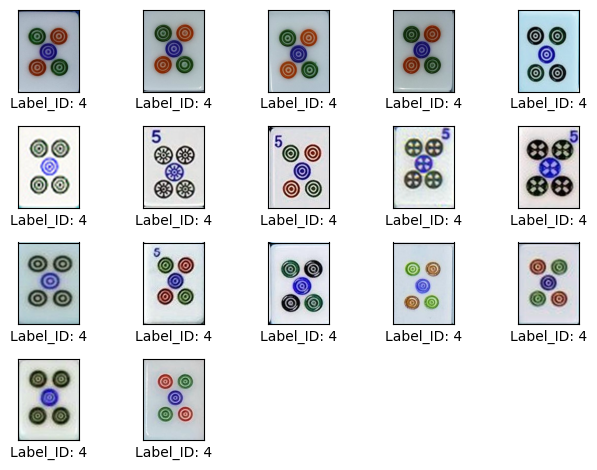

Int64Index([ 26,  47,  60, 111, 167, 196, 238, 280, 332, 358, 400, 420, 487,
            525, 567, 612, 661],
           dtype='int64')


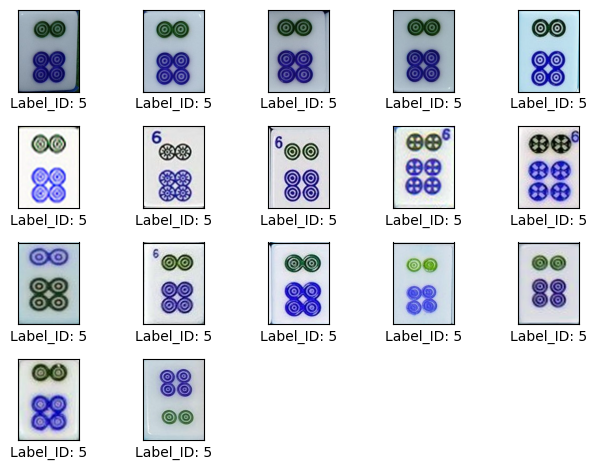

Int64Index([ 25,  45,  89, 101, 166, 192, 250, 277, 331, 355, 397, 421, 484,
            522, 564, 609, 628, 662],
           dtype='int64')


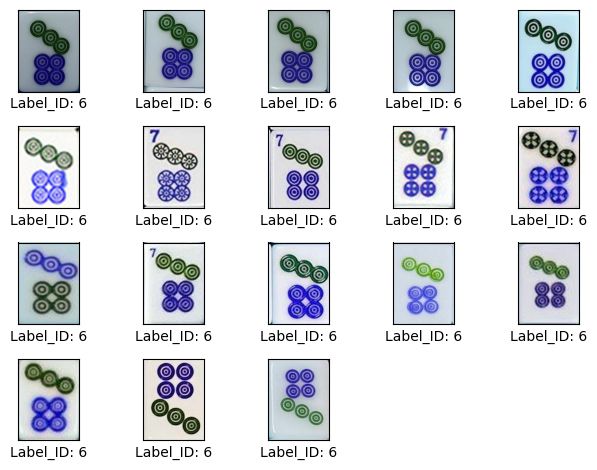

Int64Index([ 75, 129, 132, 165, 188, 239, 274, 330, 349, 352, 393, 422, 481,
            519, 561, 606, 663],
           dtype='int64')


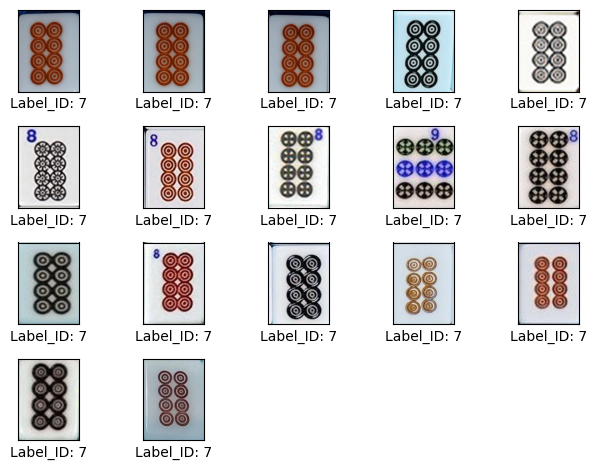

Int64Index([ 31,  51,  64,  73, 163, 199, 259, 294, 304, 372, 414, 452, 501,
            539, 581, 626, 643, 665, 676, 677],
           dtype='int64')


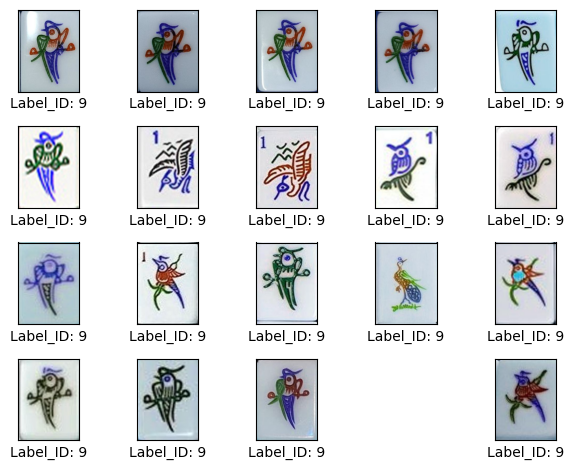

Int64Index([68, 130, 137, 162, 195, 231, 291, 303, 369, 411, 457, 498, 536,
            578, 623, 666],
           dtype='int64')


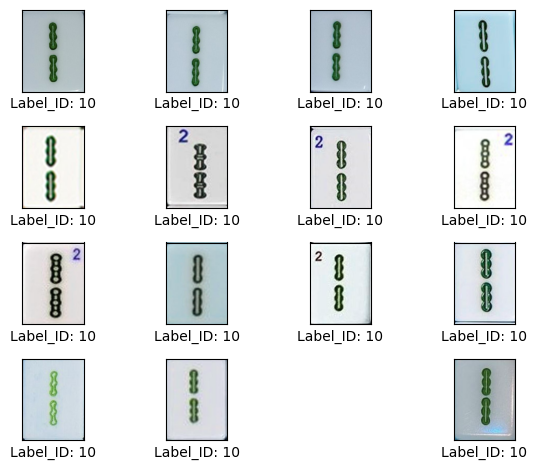

Int64Index([ 29,  54,  77, 133, 161, 191, 243, 288, 298, 366, 408, 458, 495,
            533, 575, 620, 667],
           dtype='int64')


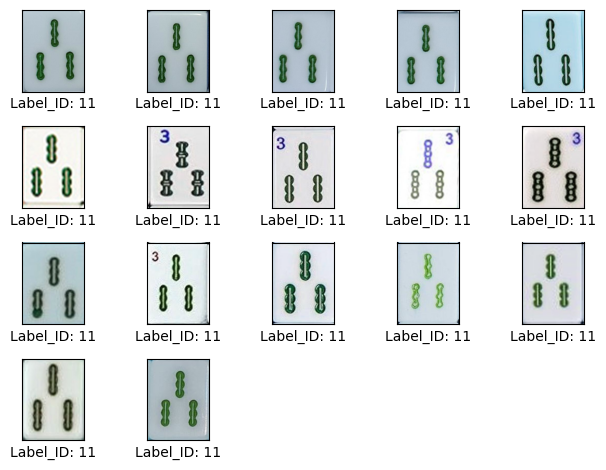

Int64Index([ 69,  70,  87, 117, 160, 187, 241, 285, 297, 363, 405, 459, 492,
            530, 572, 617, 668],
           dtype='int64')


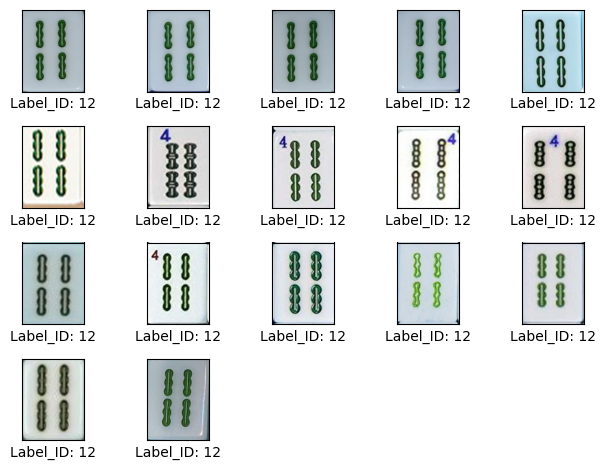

Int64Index([ 95,  97, 105, 134, 159, 186, 233, 282, 302, 360, 402, 460, 489,
            527, 569, 614, 669],
           dtype='int64')


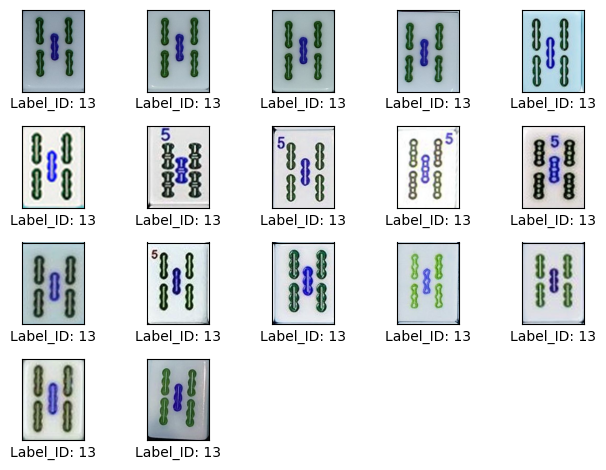

Int64Index([ 59,  72,  79, 100, 158, 198, 230, 279, 301, 357, 399, 447, 486,
            524, 566, 611, 670],
           dtype='int64')


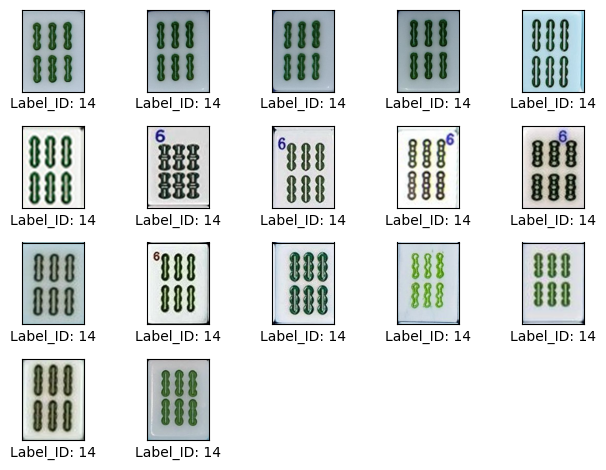

Int64Index([7, 28, 71, 124, 157, 194, 240, 276, 300, 354, 396, 448, 483, 521,
            563, 608, 671],
           dtype='int64')


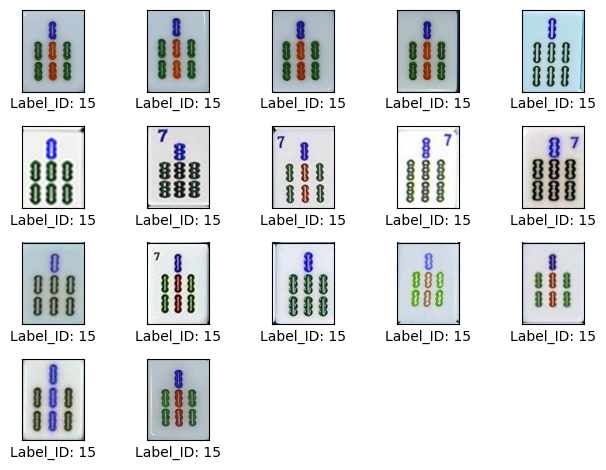

Int64Index([ 10,  65,  88, 106, 180, 217, 234, 290, 327, 368, 410, 453, 497,
            535, 577, 622, 648],
           dtype='int64')


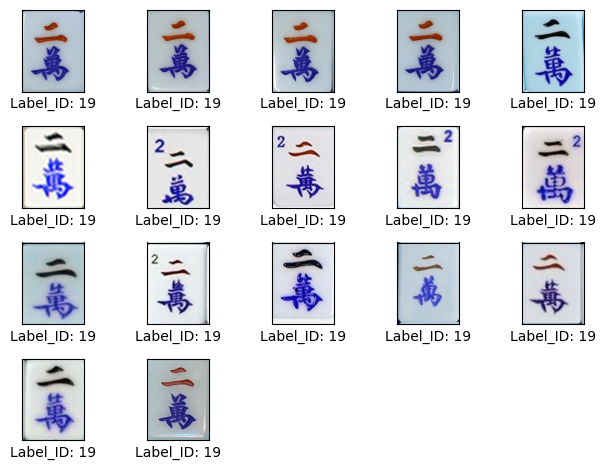

Int64Index([48, 82, 84, 179, 213, 245, 287, 326, 365, 407, 454, 494, 532, 574,
            619, 649],
           dtype='int64')


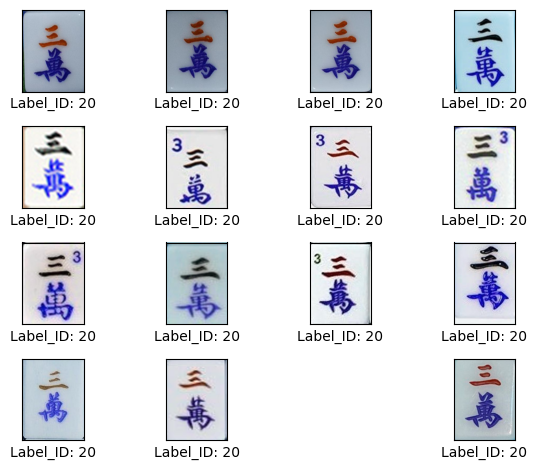

Int64Index([ 13,  21,  42, 118, 177, 222, 235, 281, 324, 359, 401, 456, 488,
            526, 568, 613, 651],
           dtype='int64')


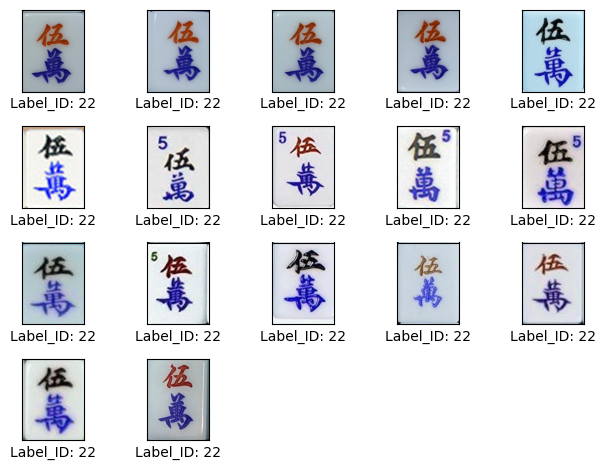

Int64Index([6, 41, 53, 128, 176, 221, 246, 278, 323, 356, 398, 443, 485, 523,
            565, 610, 652],
           dtype='int64')


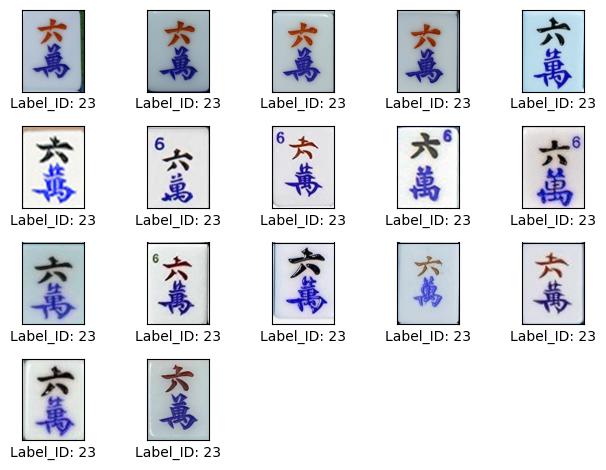

Int64Index([1, 11, 39, 174, 212, 236, 272, 321, 350, 392, 445, 479, 517, 559,
            604, 654, 678],
           dtype='int64')


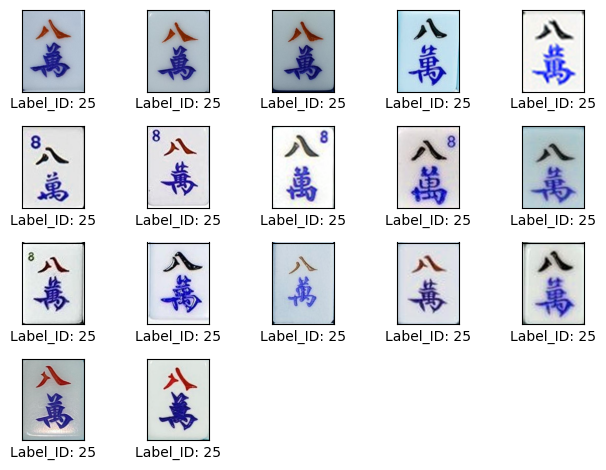

Int64Index([ 19,  23,  81, 110, 145, 215, 232, 266, 318, 345, 384, 433, 471,
            509, 551, 596, 640, 697],
           dtype='int64')


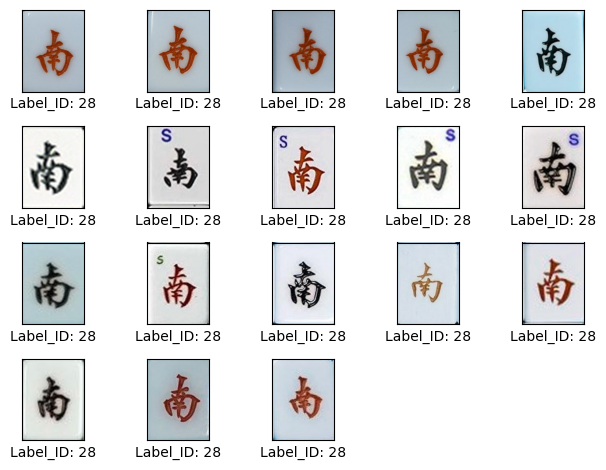

Int64Index([  8,  14,  52,  80, 143, 204, 258, 264, 316, 338, 383, 418, 470,
            508, 553, 595, 642, 699],
           dtype='int64')


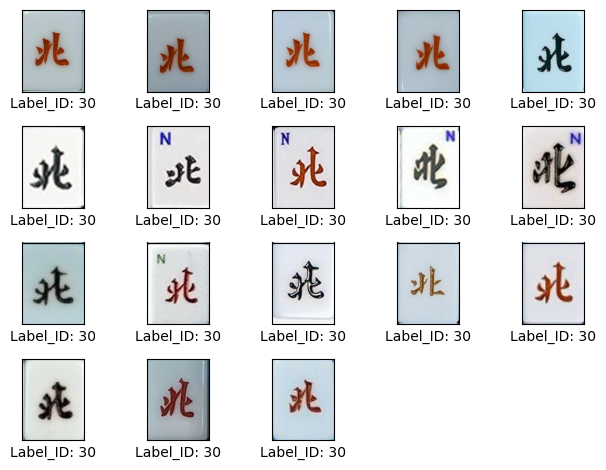

Int64Index([135, 154, 210, 256, 260, 312, 340, 381, 426, 468, 544, 589, 638,
            683],
           dtype='int64')


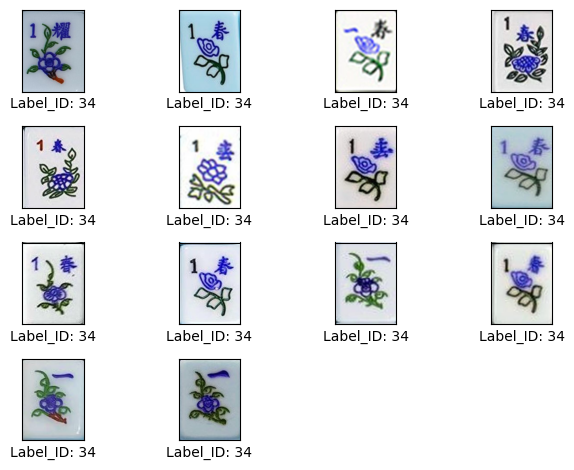

Int64Index([3, 153, 209, 253, 261, 311, 342, 380, 425, 467, 543, 588, 637, 684,
            690],
           dtype='int64')


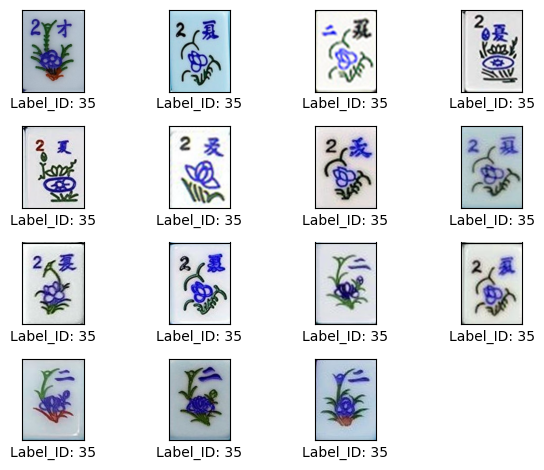

Int64Index([5, 152, 208, 252, 262, 310, 341, 379, 424, 466, 542, 587, 636, 685,
            691],
           dtype='int64')


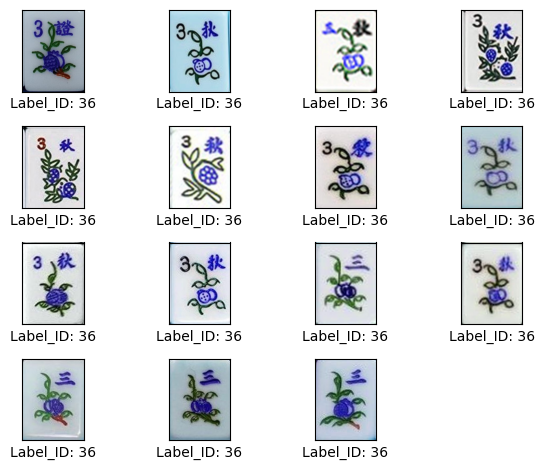

Int64Index([0, 151, 207, 251, 263, 309, 343, 378, 419, 465, 541, 586, 629, 635,
            686, 692],
           dtype='int64')


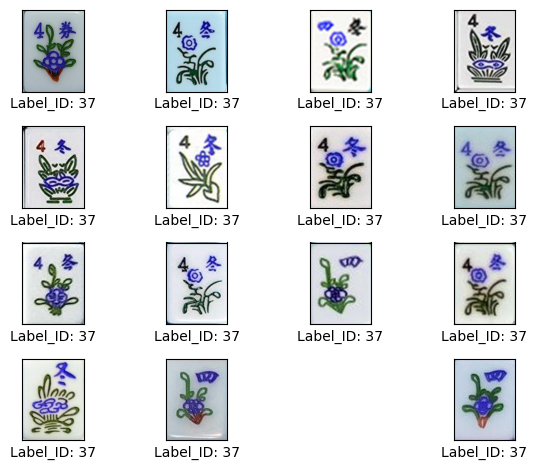

Int64Index([36, 150, 203, 308, 377, 442, 464, 506, 548, 593, 634, 679], dtype='int64')


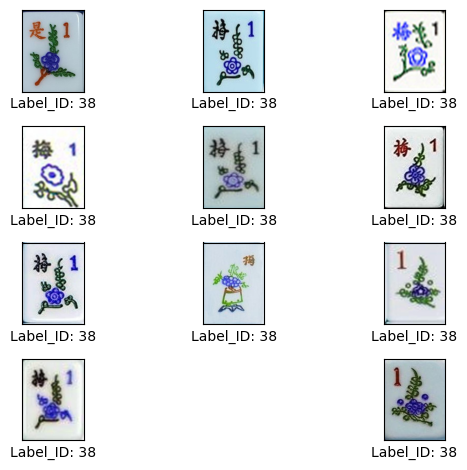

Int64Index([138, 149, 202, 307, 376, 441, 463, 505, 547, 592, 633, 680, 687], dtype='int64')


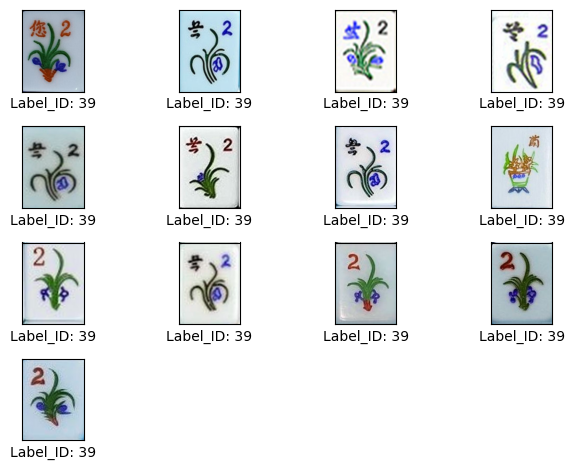

Int64Index([33, 147, 201, 306, 375, 440, 462, 504, 546, 591, 632, 681, 688], dtype='int64')


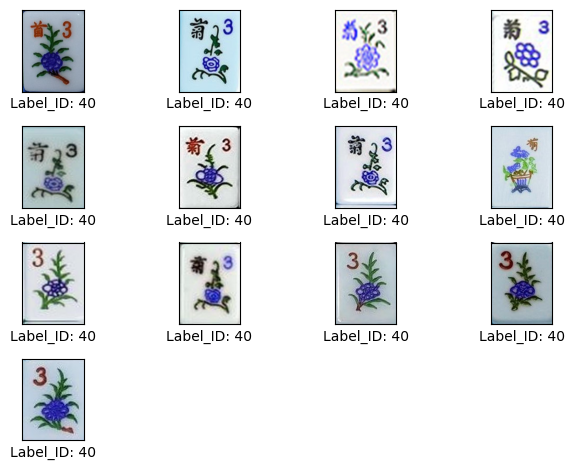

Int64Index([94, 148, 200, 305, 374, 435, 461, 503, 545, 590, 631, 682, 689], dtype='int64')


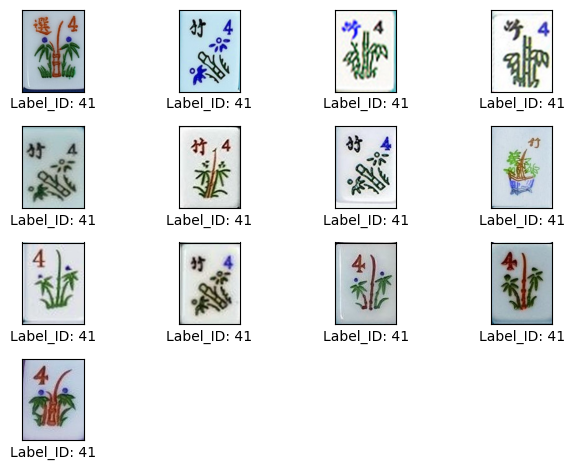

In [58]:
#Display all images of labels we got in f1_list, which is obtained from the function worst_f1_extract
for i in index_list:
    display_image_label(i)

Serveral observations:
1. The wrong label for image 349, should be label 8 instead of 7.
2. Some of the images in label id 5 and 6 has been rotated by 180 degrees, but this should have taken into account during training with data augmentation of RandomRotation. </br>
3. It is also suspected that the number/alphabets in the corner may affect the classification, let's see if RandomZoom will also improve the situation. </br> 

First, replace the label of images index 349.

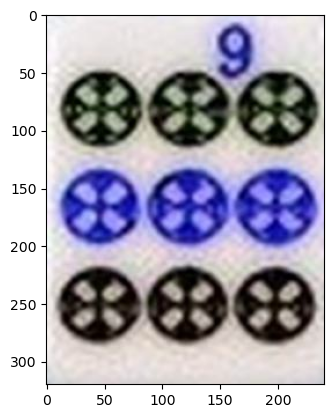

In [59]:
plt.imshow(images[349].astype("uint8"))

In [60]:
mj_df.loc[349,['label_id', 'label_name']] = [8, 'dots-9']
label = np.array(mj_df['label_id'])

### Checking other folds for poor performance labels (with f1-score < 0.7) to see if there exist other potential issues.

Worst performing labels with f1-scocre < 0.7 are: [9, 12, 13, 22, 34, 36, 37, 38, 40]
List of labels and corresponding index in data set:


,label,index
25,9,626
26,9,31
29,9,581
28,12,617
30,12,70
7,13,95
8,13,614
92,13,97
31,22,177
69,22,222


No. of images in test set  with f1-scocre < 0.7 21


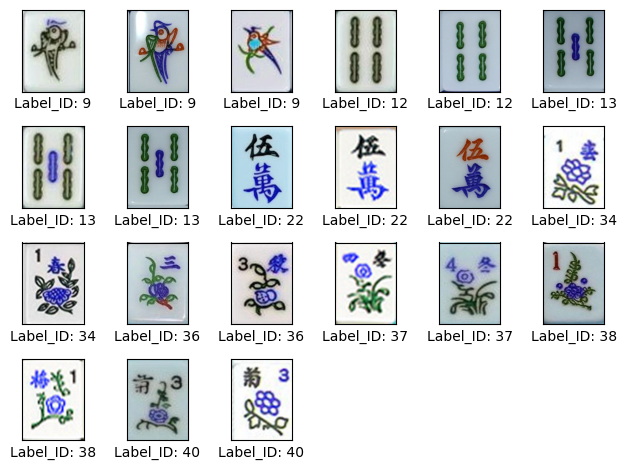

Worst performing labels with f1-scocre < 0.7 are: [6, 10, 11, 12, 19, 34, 35, 36, 37, 38, 40]
List of labels and corresponding index in data set:


,label,index
36,6,564
89,6,101
19,6,250
20,10,666
0,10,578
16,10,137
11,11,191
35,11,458
65,11,366
107,12,572


No. of images in test set  with f1-scocre < 0.7 28


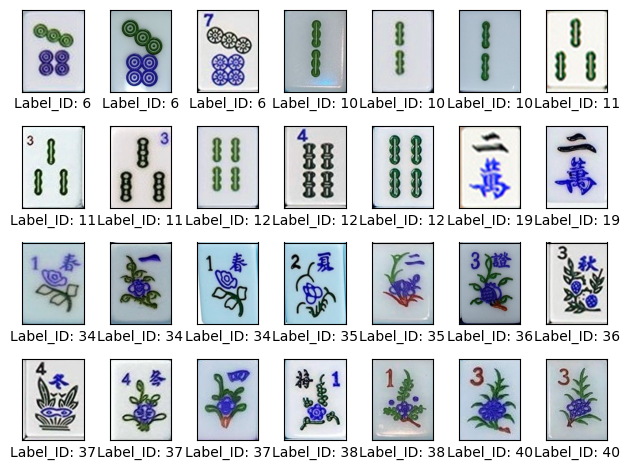

Worst performing labels with f1-scocre < 0.7 are: [12, 28, 34, 36, 37, 38, 40]
List of labels and corresponding index in data set:


,label,index
7,12,530
84,12,69
57,12,405
40,28,318
101,28,345
109,28,232
95,34,135
99,34,260
43,36,310
45,36,379


No. of images in test set  with f1-scocre < 0.7 17


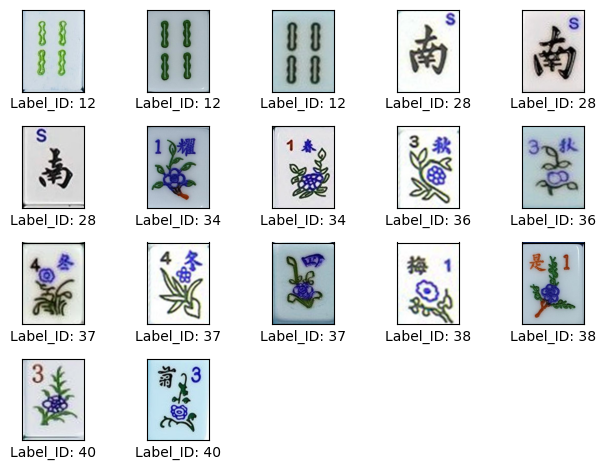

Worst performing labels with f1-scocre < 0.7 are: [4, 5, 6, 11, 13, 19, 20, 34, 37, 39]
List of labels and corresponding index in data set:


,label,index
12,4,228
90,4,528
58,4,76
97,5,525
74,5,567
106,5,332
8,6,397
68,6,609
107,11,77
47,11,288


No. of images in test set  with f1-scocre < 0.7 25


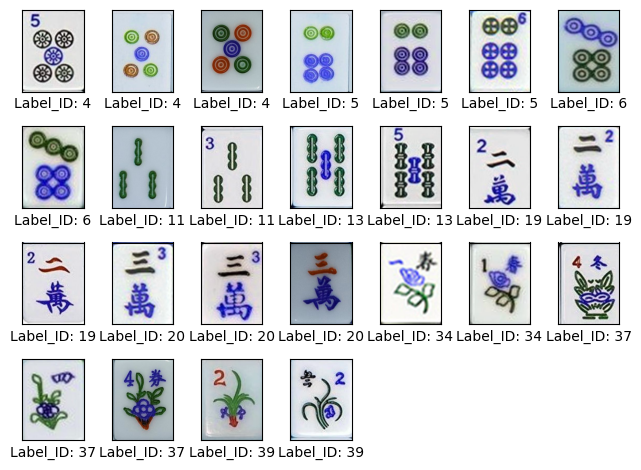

Worst performing labels with f1-scocre < 0.7 are: [12, 14, 15, 19, 20, 23, 30, 34, 37, 40, 41]
List of labels and corresponding index in data set:


,label,index
28,12,363
47,12,668
20,14,486
89,14,158
56,14,301
9,15,157
97,15,28
43,15,276
5,19,65
68,19,577


No. of images in test set  with f1-scocre < 0.7 27


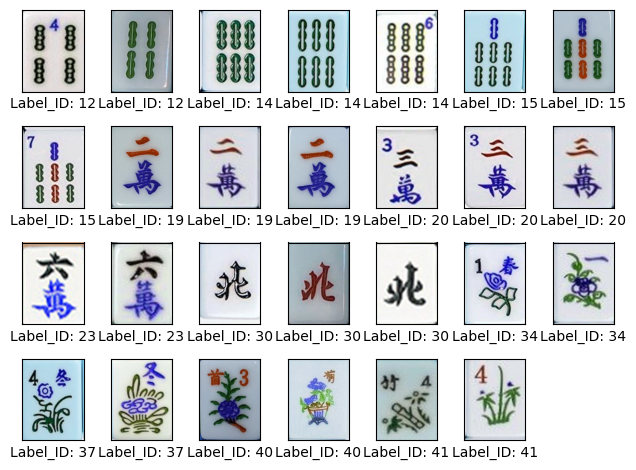

In [61]:
for fold, (train_index, val_index) in enumerate(skf.split(indices_trainval, label[indices_trainval])):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    f1_thresold = 0.7
    val_img, val_label, num_img = get_f1_set(cr_df_list[fold], f1_thresold, val_index)
    display_image(val_img, val_label, num_img)

No specific observations found from other folds.

In [56]:
cr = classification_report(y_val, y_val_pred, output_dict=True)
print('Macro f1 score:', f1_score(y_val, y_val_pred, average = "macro"))
cr_df = pd.DataFrame.from_dict(cr).T
cr_df[cr_df['f1-score']<1]

Macro f1 score: 0.9057256235827664


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
5,0.000000,0.000000,0.000000,2.0000
6,0.600000,1.000000,0.750000,3.0000
13,0.750000,1.000000,0.857143,3.0000
17,1.000000,0.666667,0.800000,3.0000
34,1.000000,0.500000,0.666667,2.0000
36,0.500000,0.500000,0.500000,2.0000
37,0.500000,1.000000,0.666667,2.0000
38,0.666667,1.000000,0.800000,2.0000
40,0.000000,0.000000,0.000000,2.0000
accuracy,0.937500,0.937500,0.937500,0.9375


Labels 4,7,10,11,12,19,20 have a f1-score <0.9, let's try to get an insight from the corresponding images from the data set.

In [59]:
f1_thresold = 1
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold, val_best)

Worst performing labels with f1-scocre < 1 are: [5, 6, 13, 17, 34, 36, 37, 38, 40]
List of labels and corresponding index in data set:


,label,index
45,5,111
22,5,167
12,6,421
33,6,277
35,6,250
11,13,134
18,13,159
58,13,527
85,17,450
55,17,390


No. of images in test set  with f1-scocre < 1 21


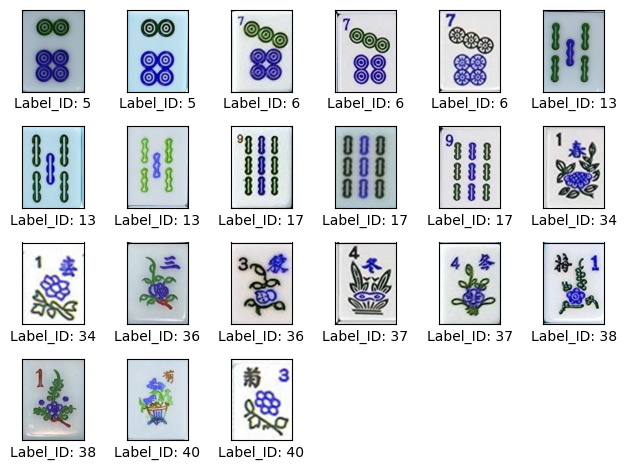

In [60]:
display_image(val_img, val_label, num_img)

In [63]:
model.load_weights(f'weights-fine-4.hdf5')

In [64]:
y_val_pred = model.predict(X_val)
y_val_pred = np.argmax(y_val_pred,axis = 1)

7/7 [==============================] - 3s 363ms/step


Then we will get the classification report, and see which label id are performing the worst.

In [65]:
cr = classification_report(y_val, y_val_pred, output_dict=True)
print('Macro f1 score:', f1_score(y_val, y_val_pred, average = "macro"))
cr_df = pd.DataFrame.from_dict(cr).T
cr_df[cr_df['f1-score']<1]

Macro f1 score: 1.0


,precision,recall,f1-score,support


In [59]:
f1_thresold = 1
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold, val_best)

Worst performing labels with f1-scocre < 1 are: [5, 6, 13, 17, 34, 36, 37, 38, 40]
List of labels and corresponding index in data set:


,label,index
45,5,111
22,5,167
12,6,421
33,6,277
35,6,250
11,13,134
18,13,159
58,13,527
85,17,450
55,17,390


No. of images in test set  with f1-scocre < 1 21


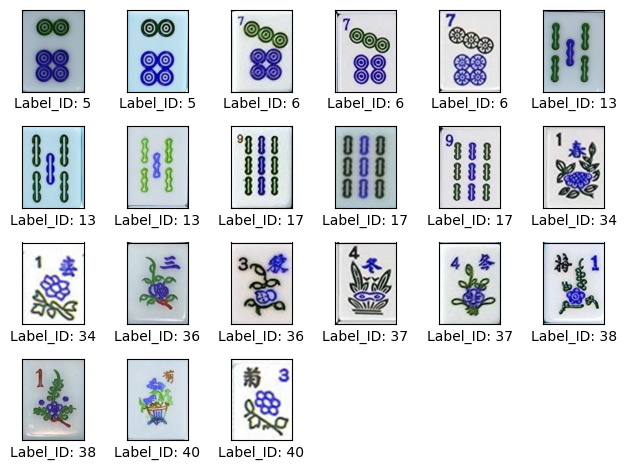

In [60]:
display_image(val_img, val_label, num_img)

It is noted that there is a wrong label_id 7, which should have a label_id 8 instead. It may be a good idea to include RandomZoom in data augmentation.</br>
Now we will try to display all images of labels that didn't perform perfectly in validation set.

In [67]:
#Define a new function to display all images from a label
def display_image_label(label):
    img_arr_withlabel = []
    img_index = mj_df.index[mj_df['label_id'] == label]
    print(img_index)
    for i in img_index:
        img_arr_withlabel.append(images[i])
    label_arr = np.full(len(img_index), label)
    display_image(img_arr_withlabel, label_arr, len(label_arr))

In [68]:
f1_thresold = 1
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold, val_best)

Worst performing labels with f1-scocre < 1 are: [4, 7, 10, 11, 12, 19, 20]
List of labels and corresponding index in data set:


,label,index
88,4,439
35,4,183
24,7,132
70,7,349
47,7,239
60,10,303
83,10,411
74,11,366
92,11,458
12,11,77


No. of images in test set  with f1-scocre < 1 22


In [67]:
#Define a new function to display all images from a label
def display_image_label(label):
    img_arr_withlabel = []
    img_index = mj_df.index[mj_df['label_id'] == label]
    print(img_index)
    for i in img_index:
        img_arr_withlabel.append(images[i])
    label_arr = np.full(len(img_index), label)
    display_image(img_arr_withlabel, label_arr, len(label_arr))

Int64Index([57, 76, 86, 90, 168, 183, 228, 283, 333, 361, 403, 439, 490, 528,
            570, 615, 660],
           dtype='int64')


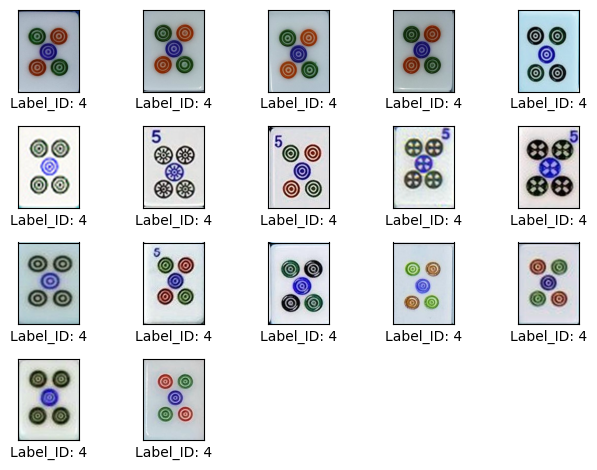

Int64Index([ 75, 129, 132, 165, 188, 239, 274, 330, 349, 352, 393, 422, 481,
            519, 561, 606, 663],
           dtype='int64')


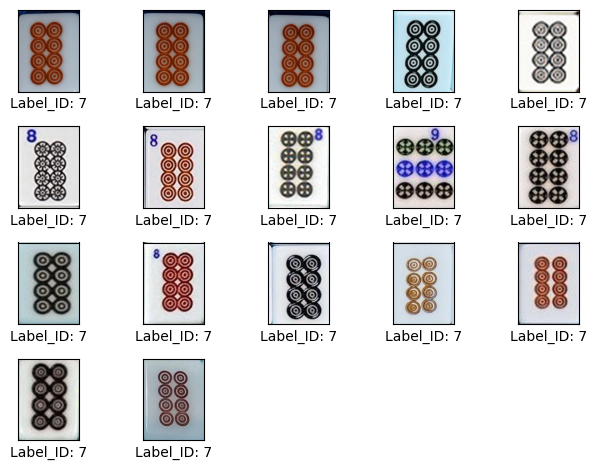

Int64Index([68, 130, 137, 162, 195, 231, 291, 303, 369, 411, 457, 498, 536,
            578, 623, 666],
           dtype='int64')


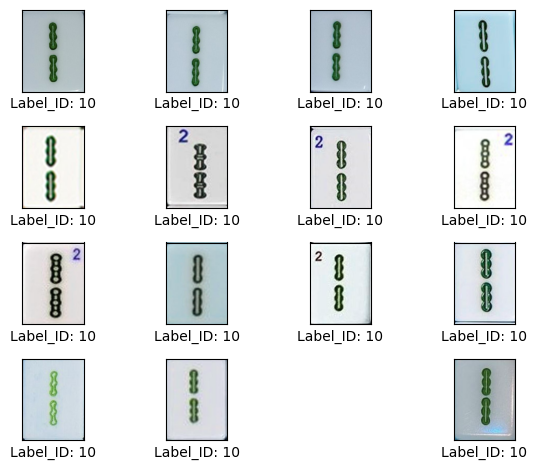

Int64Index([ 29,  54,  77, 133, 161, 191, 243, 288, 298, 366, 408, 458, 495,
            533, 575, 620, 667],
           dtype='int64')


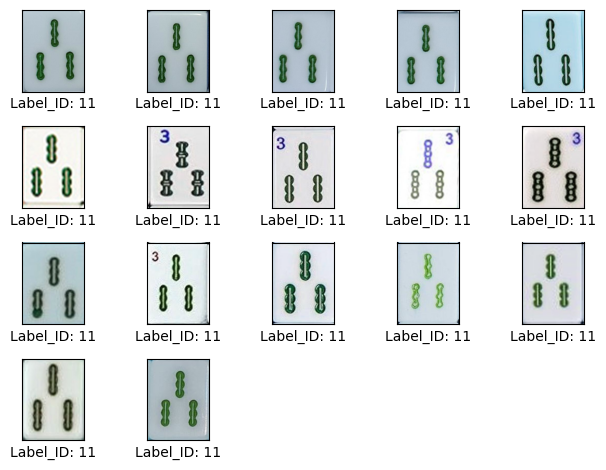

Int64Index([ 69,  70,  87, 117, 160, 187, 241, 285, 297, 363, 405, 459, 492,
            530, 572, 617, 668],
           dtype='int64')


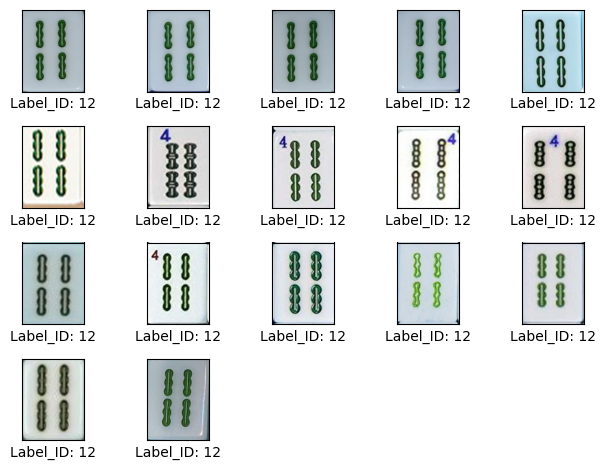

Int64Index([ 10,  65,  88, 106, 180, 217, 234, 290, 327, 368, 410, 453, 497,
            535, 577, 622, 648],
           dtype='int64')


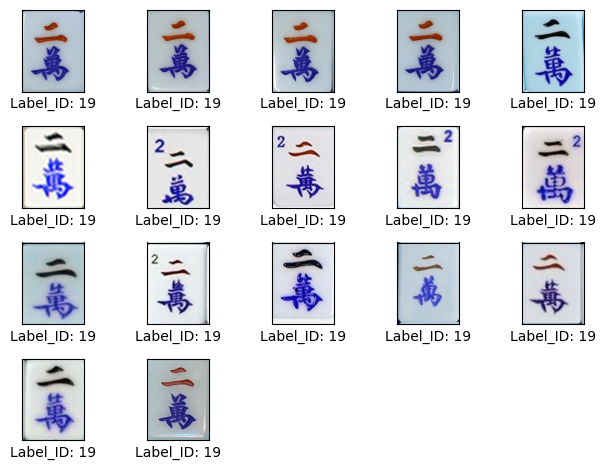

Int64Index([48, 82, 84, 179, 213, 245, 287, 326, 365, 407, 454, 494, 532, 574,
            619, 649],
           dtype='int64')


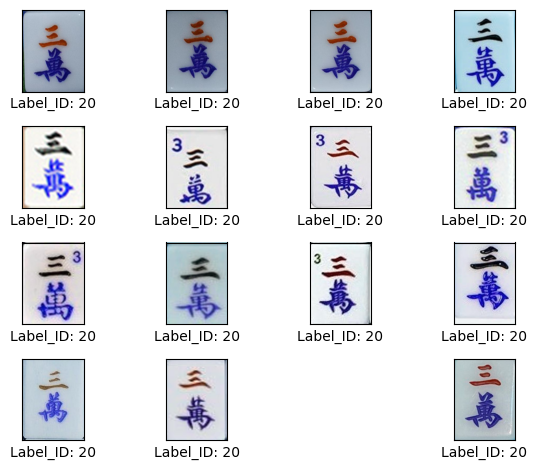

In [ ]:
#Display all images of labels we got in f1_list, which is obtained from the function worst_f1_extract
for i in f1_list:
    display_image_label(i)

Serveral observations:
1. The wrong label for image 349, should be label 8 instead of 7.
2. Some of the images in label id 5 and 6 has been rotated by 180 degrees, but this should have taken into account during training with data augmentation of RandomRotation. </br>
3. It is also suspected that the number/alphabets in the corner may affect the classification, let's see if RandomZoom will also improve the situation. </br> 
4. Last, adopt dropout to see if the overfitting could be further improved.

First we will replace the label of image 349.

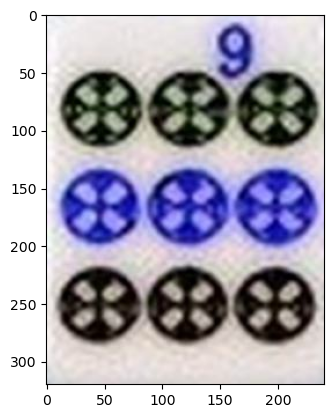

In [136]:
plt.imshow(images[349].astype("uint8"))

In [137]:
mj_df.loc[349,['label_id', 'label_name']] = [8, 'dots-9']
label = np.array(mj_df['label_id'])

## Model Enhancement with random zoom

It was suspected that the number/alphabets in the corner may affect the classification, let's see if RandomZoom will also improve the situation

In [50]:
data_augmentation = tf.keras.Sequential([
    #New layer of RandomZoom of 10% added
    layers.RandomZoom(0.1),
    
    layers.RandomRotation(0.5),
    layers.RandomBrightness(0.5),
    layers.RandomContrast(0.3),
    layers.RandomFlip("horizontal_and_vertical"),  
    layers.RandomTranslation(height_factor = (-0.2,0), width_factor = 0.2, fill_mode = 'nearest')
])

In [51]:
inputs = tf.keras.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)
print(x.shape)
      
x = preprocess_input(x)
print(x.shape)

x = base_model(x, training=False)
print(x.shape)

x = global_average_layer(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


In [52]:
total_epochs = 0
acc = []
val_acc = []
loss = []
val_loss = []
acc_tuple = ()
loss_tuple = ()
acc_drop_performance =[]
loss_drop_performance = []

fold = 0


In [53]:
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    train_ds = get_ds(train_index)
    val_ds = get_ds(val_index)
    
    base_model.trainable = False
    base_learning_rate = 0.001   
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )    
    
    model.reset_states()
    model.load_weights('model.h5')
   
    total_epochs = 0
    

    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-zoom-{fold}.hdf5", save_best_only=True, save_weights_only=True)

    
    print('Fold {} output layers training'.format(fold))
 
    epochs = 20
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = epochs,
                        callbacks=[cp_callback]
                        )
    
    total_epochs += epochs
    print("Total epochs:", total_epochs)
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_drop_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_drop_performance.append(loss_tuple)
    

#Base model layer training

    #Set base model to trainable
    base_model.trainable = True

    #Fine-tune from this layer onwards
    fine_tune_at = 80

    #Freeze all the layers before the `fine_tune_at` layer
    for layer in base_model.layers[:fine_tune_at]:
      layer.trainable = False

    #Compile to model again
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
    
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-fine-zoom-{fold}.hdf5", save_best_only=True, save_weights_only=True)

#Continue training of base model
    print('Fold {} base model training'.format(fold))
    
    early_patience = 10
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor= 'val_accuracy', patience =early_patience, mode='max', min_delta =0.01, restore_best_weights=True)
    
    epochs = 40
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = total_epochs + epochs,
                        initial_epoch = total_epochs,
                        callbacks=[cp_callback, early_stopping]
                        )
    
    final_epoch = total_epochs + len(history.epoch)
    
    if final_epoch == 60:
        print('Training ended at epoch', final_epoch)
    else:
        print("Early stopping at Epoch",(early_stopping.stopped_epoch + 1))
        print("Best epoch observed in",(early_stopping.stopped_epoch +1 - early_patience))
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_drop_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_drop_performance.append(loss_tuple)
    
    
    fold += 1

Fold 0 output layers training
Epoch 1/20
28/28 [==============================] - 26s 514ms/step - loss: 3.6803 - accuracy: 0.0804 - val_loss: 3.0676 - val_accuracy: 0.1696
Epoch 2/20
28/28 [==============================] - 14s 496ms/step - loss: 2.4856 - accuracy: 0.3460 - val_loss: 2.4553 - val_accuracy: 0.3214
Epoch 3/20
28/28 [==============================] - 13s 471ms/step - loss: 2.0231 - accuracy: 0.4487 - val_loss: 2.0981 - val_accuracy: 0.3929
Epoch 4/20
28/28 [==============================] - 13s 477ms/step - loss: 1.6669 - accuracy: 0.5290 - val_loss: 1.8567 - val_accuracy: 0.4464
Epoch 5/20
28/28 [==============================] - 13s 469ms/step - loss: 1.5417 - accuracy: 0.5714 - val_loss: 1.7048 - val_accuracy: 0.4821
Epoch 6/20
28/28 [==============================] - 13s 474ms/step - loss: 1.3228 - accuracy: 0.5960 - val_loss: 1.5946 - val_accuracy: 0.5089
Epoch 7/20
28/28 [==============================] - 13s 484ms/step - loss: 1.1849 - accuracy: 0.6830 - val_loss:

In [70]:
acc_drop_df = pd.DataFrame(acc_drop_performance)
acc_drop_df.set_axis(['fold', 'train_acc', 'val_acc'], axis=1, inplace=True)
acc_drop_df

,fold,train_acc,val_acc
0,0,"[0.0803571417927742, 0.3459821343421936, 0.448...","[0.1696428507566452, 0.3214285671710968, 0.392..."
1,0,"[0.6428571343421936, 0.7544642686843872, 0.779...","[0.6339285969734192, 0.5892857313156128, 0.705..."
2,1,"[0.1004464253783226, 0.3125, 0.439732134342193...","[0.1875, 0.3125, 0.3392857015132904, 0.3928571..."
3,1,"[0.6495535969734192, 0.7767857313156128, 0.790...","[0.625, 0.6071428656578064, 0.6964285969734192..."
4,2,"[0.0870535746216774, 0.296875, 0.4330357015132...","[0.25, 0.3839285671710968, 0.4196428656578064,..."
5,2,"[0.609375, 0.765625, 0.7723214030265808, 0.837...","[0.6339285969734192, 0.6071428656578064, 0.607..."
6,3,"[0.0736607164144516, 0.3013392984867096, 0.441...","[0.2232142835855484, 0.4017857015132904, 0.437..."
7,3,"[0.6116071343421936, 0.7388392686843872, 0.774...","[0.625, 0.6428571343421936, 0.6428571343421936..."
8,4,"[0.078125, 0.3102678656578064, 0.4441964328289...","[0.2232142835855484, 0.3303571343421936, 0.383..."
9,4,"[0.6495535969734192, 0.7544642686843872, 0.823...","[0.5803571343421936, 0.5714285969734192, 0.678..."


In [71]:
acc_drop_lst = performance_to_list(acc_drop_performance)
loss_drop_lst = performance_to_list(loss_drop_performance)

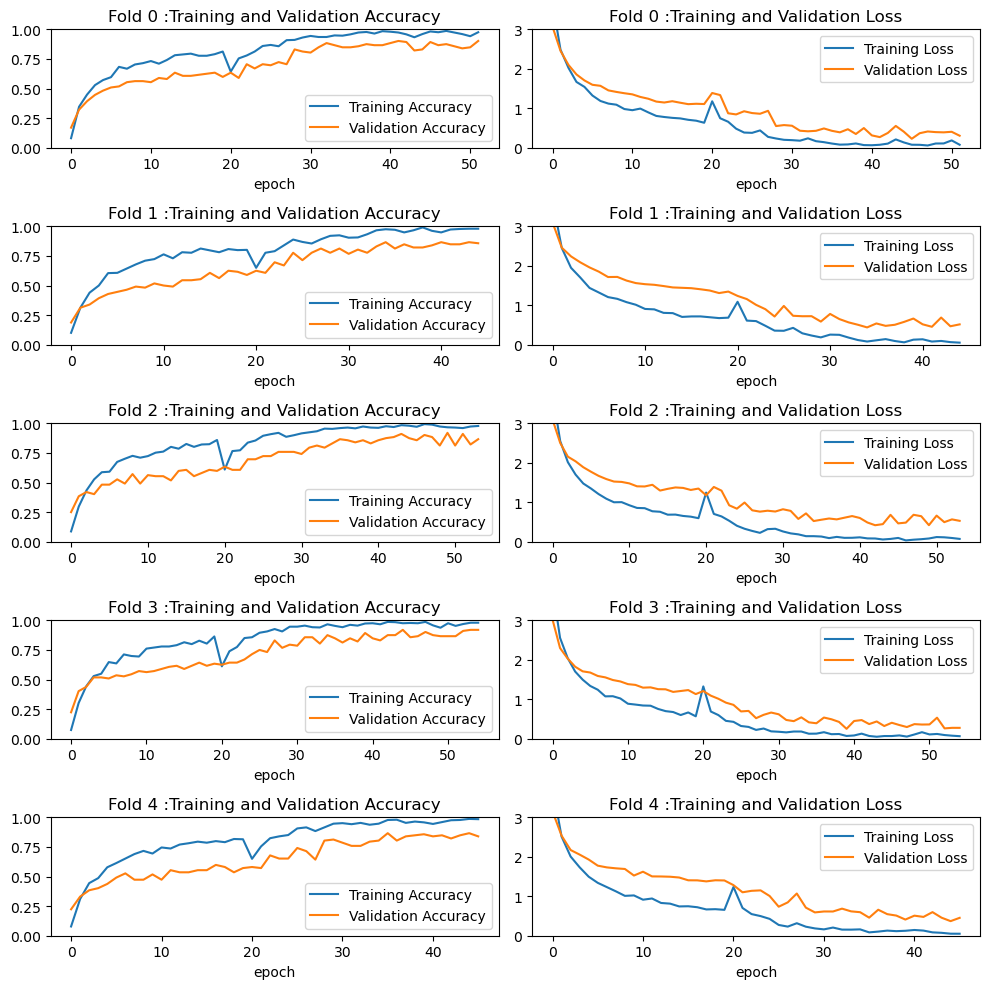

In [72]:
fig, ax = plt.subplots(5, 2, figsize=(10, 10))

for i in range(5):

    ax[i, 0].plot(acc_drop_lst[i][0], label='Training Accuracy')
    ax[i, 0].plot(acc_drop_lst[i][1], label='Validation Accuracy')
    ax[i, 0].set_ylim([0, 1])
    ax[i, 0].legend(loc='lower right')
    title = 'Fold {} :Training and Validation Accuracy'.format(i)
    ax[i, 0].set_title(title)
    ax[i, 0].set_xlabel('epoch')
    
    ax[i, 1].plot(loss_drop_lst[i][0], label='Training Loss')
    ax[i, 1].plot(loss_drop_lst[i][1], label='Validation Loss')
    ax[i, 1].set_ylim([0, 3.0])
    ax[i, 1].legend(loc='upper right')
    title = 'Fold {} :Training and Validation Loss'.format(i)
    ax[i, 1].set_title(title)
    ax[i, 1].set_xlabel('epoch')

plt.tight_layout()
plt.show()
    
    

In [64]:
fold = 0
best_fold = -1
val_best = []
best_f1 = -1
cr_df_list = []
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    model.load_weights(f"weights-fine-zoom-{fold}.hdf5")
    X_val, y_val = get_Xy_ds(val_index)
    y_val_pred = model.predict(X_val)
    y_val_pred = np.argmax(y_val_pred,axis = 1)
    
    f1 = f1_score(y_val_pred, y_val, average = "macro")
    cr = classification_report(y_val, y_val_pred, output_dict=True)
    cr_df = pd.DataFrame.from_dict(cr).T
    cr_df_list.append(cr_df)
    
    if f1 > best_f1:
        best_f1 = f1
        best_fold = fold
        val_best = val_index
    print(f"Fold {fold} has a F1-score of", f1)
    
    fold +=1

print(f"Fold {best_fold} has the highest F1-score of", best_f1)

7/7 [==============================] - 6s 371ms/step
Fold 0 has a F1-score of 0.8624716553287981


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


7/7 [==============================] - 3s 378ms/step
Fold 1 has a F1-score of 0.8587301587301587
7/7 [==============================] - 2s 333ms/step
Fold 2 has a F1-score of 0.8763605442176869
7/7 [==============================] - 2s 326ms/step
Fold 3 has a F1-score of 0.8926303854875283
7/7 [==============================] - 2s 351ms/step
Fold 4 has a F1-score of 0.8542517006802719
Fold 3 has the highest F1-score of 0.8926303854875283


No significant improvement observed after introducing random zoom. We will now use Fold 3 model on the test set.

In [75]:
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    train_ds = get_ds(train_index)
    val_ds = get_ds(val_index)
    
    base_model.trainable = False
    base_learning_rate = 0.001   
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )    
    
    model.reset_states()
    model.load_weights('model.h5')
   
    total_epochs = 0
    

    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-drop-{fold}.hdf5", save_best_only=True, save_weights_only=True)

    
    print('Fold {} output layers training'.format(fold))
 
    epochs = 20
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = epochs,
                        callbacks=[cp_callback]
                        )
    
    total_epochs += epochs
    print("Total epochs:", total_epochs)
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_drop_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_drop_performance.append(loss_tuple)
    

#Base model layer training

    #Set base model to trainable
    base_model.trainable = True

    #Fine-tune from this layer onwards
    fine_tune_at = 80

    #Freeze all the layers before the `fine_tune_at` layer
    for layer in base_model.layers[:fine_tune_at]:
      layer.trainable = False

    #Compile to model again
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
    
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-fine-drop-{fold}.hdf5", save_best_only=True, save_weights_only=True)

#Continue training
    print('Fold {} base model training'.format(fold))
    
    early_patience = 10
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=early_patience, mode='max', min_delta=0.01, restore_best_weights=True)
    
    epochs = 40
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = total_epochs + epochs,
                        initial_epoch = total_epochs,
                        callbacks=[cp_callback, early_stopping]
                        )
    
    final_epoch = total_epochs + len(history.epoch)
    print(final_epoch)
    
    if final_epoch == 60:
        print('Training ended at epoch', final_epoch)
    else:
        print("Early stopping at Epoch",(early_stopping.stopped_epoch + 1))
        print("Best epoch observed in",(early_stopping.stopped_epoch +1 - early_patience))
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_drop_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_drop_performance.append(loss_tuple)
    
    
    fold += 1

Fold 0 output layers training
Epoch 1/20
28/28 [==============================] - 26s 539ms/step - loss: 3.6725 - accuracy: 0.1027 - val_loss: 2.9933 - val_accuracy: 0.1696
Epoch 2/20
28/28 [==============================] - 13s 458ms/step - loss: 2.4294 - accuracy: 0.3393 - val_loss: 2.3191 - val_accuracy: 0.3482
Epoch 3/20
28/28 [==============================] - 13s 475ms/step - loss: 1.9551 - accuracy: 0.4308 - val_loss: 2.0490 - val_accuracy: 0.3750
Epoch 4/20
28/28 [==============================] - 13s 463ms/step - loss: 1.6674 - accuracy: 0.4978 - val_loss: 1.8302 - val_accuracy: 0.4554
Epoch 5/20
28/28 [==============================] - 13s 459ms/step - loss: 1.4585 - accuracy: 0.5826 - val_loss: 1.6799 - val_accuracy: 0.5000
Epoch 6/20
28/28 [==============================] - 13s 460ms/step - loss: 1.3744 - accuracy: 0.5826 - val_loss: 1.5949 - val_accuracy: 0.5089
Epoch 7/20
28/28 [==============================] - 13s 460ms/step - loss: 1.2204 - accuracy: 0.6518 - val_loss:

In [76]:
acc_drop_df = pd.DataFrame(acc_drop_performance)
acc_drop_df.set_axis(['fold', 'train_acc', 'val_acc'], axis=1, inplace=True)
acc_drop_df

,fold,train_acc,val_acc
0,0,"[0.1026785746216774, 0.3392857015132904, 0.430...","[0.1696428507566452, 0.3482142984867096, 0.375..."
1,0,"[0.65625, 0.7678571343421936, 0.79464286565780...","[0.5535714030265808, 0.6785714030265808, 0.687..."
2,1,"[0.0892857164144516, 0.3683035671710968, 0.448...","[0.1428571492433548, 0.2767857015132904, 0.383..."
3,1,"[0.6875, 0.7879464030265808, 0.841517865657806...","[0.4821428656578064, 0.5803571343421936, 0.589..."
4,2,"[0.1004464253783226, 0.2879464328289032, 0.439...","[0.1607142835855484, 0.2678571343421936, 0.330..."
5,2,"[0.6272321343421936, 0.734375, 0.8013392686843...","[0.5803571343421936, 0.7142857313156128, 0.651..."
6,3,"[0.0870535746216774, 0.2991071343421936, 0.455...","[0.1339285671710968, 0.2410714328289032, 0.303..."
7,3,"[0.6160714030265808, 0.7611607313156128, 0.825...","[0.625, 0.6517857313156128, 0.6875, 0.71428573..."
8,4,"[0.0870535746216774, 0.3013392984867096, 0.475...","[0.125, 0.2589285671710968, 0.3214285671710968..."
9,4,"[0.6696428656578064, 0.7611607313156128, 0.803...","[0.6517857313156128, 0.6785714030265808, 0.607..."


In [77]:
acc_drop_lst = performance_to_list(acc_drop_performance)
loss_drop_lst = performance_to_list(loss_drop_performance)

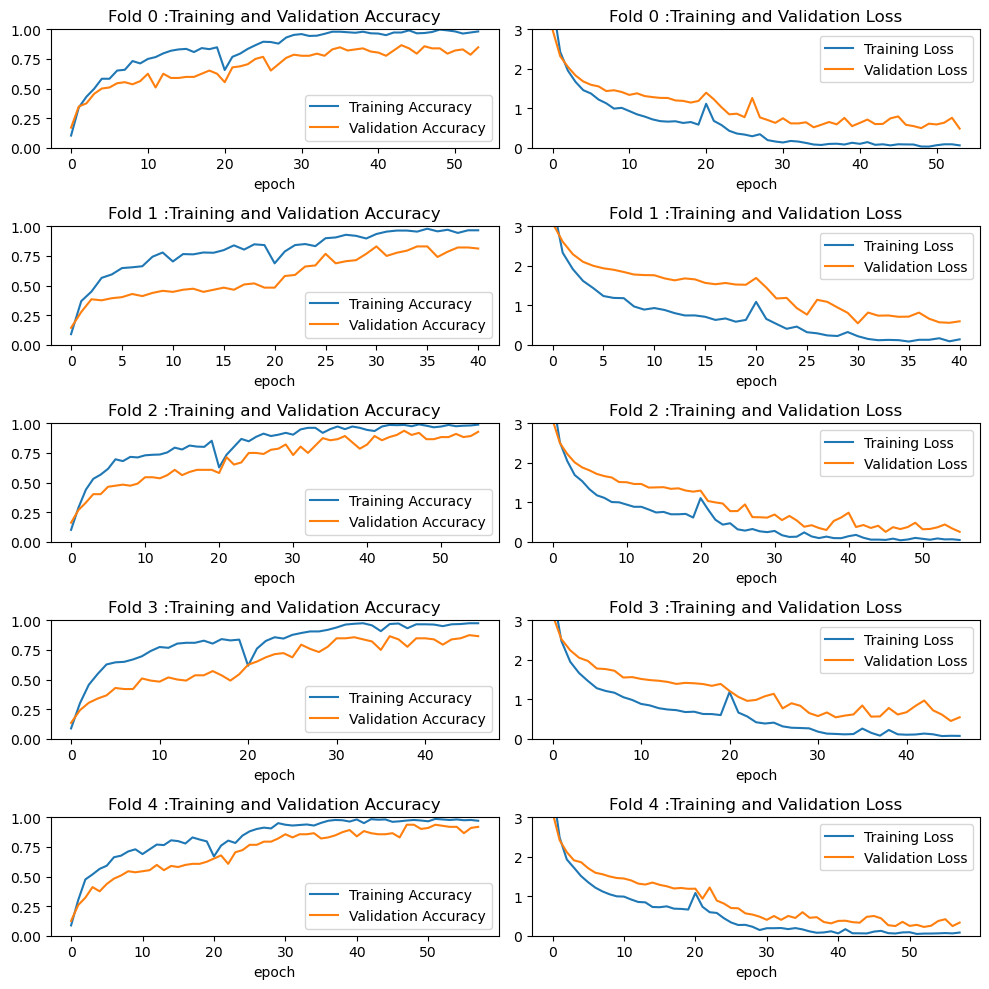

In [78]:
fig, ax = plt.subplots(5, 2, figsize=(10, 10))

for i in range(5):

    ax[i, 0].plot(acc_drop_lst[i][0], label='Training Accuracy')
    ax[i, 0].plot(acc_drop_lst[i][1], label='Validation Accuracy')
    ax[i, 0].set_ylim([0, 1])
    ax[i, 0].legend(loc='lower right')
    title = 'Fold {} :Training and Validation Accuracy'.format(i)
    ax[i, 0].set_title(title)
    ax[i, 0].set_xlabel('epoch')
    
    ax[i, 1].plot(loss_drop_lst[i][0], label='Training Loss')
    ax[i, 1].plot(loss_drop_lst[i][1], label='Validation Loss')
    ax[i, 1].set_ylim([0, 3.0])
    ax[i, 1].legend(loc='upper right')
    title = 'Fold {} :Training and Validation Loss'.format(i)
    ax[i, 1].set_title(title)
    ax[i, 1].set_xlabel('epoch')

plt.tight_layout()
plt.show()
    
    

In [127]:
fold = 0
best_fold = -1
val_best = []
best_f1 = -1
cr_df_list = []
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    model.load_weights(f"weights-fine-drop-{fold}.hdf5")
    X_val, y_val = get_Xy_ds(val_index)
    y_val_pred = model.predict(X_val)
    y_val_pred = np.argmax(y_val_pred,axis = 1)
    
    f1 = f1_score(y_val_pred, y_val, average = "macro")
    cr = classification_report(y_val, y_val_pred, output_dict=True)
    cr_df = pd.DataFrame.from_dict(cr).T
    cr_df_list.append(cr_df)
    
    if f1 > best_f1:
        best_f1 = f1
        best_fold = fold
        val_best = val_index
    print(f"Fold {fold} has a F1-score of", f1)
    
    fold +=1

print(f"Fold {best_fold} has the highest F1-score of", best_f1)

7/7 [==============================] - 4s 344ms/step
Fold 0 has a F1-score of 0.9514739229024942
7/7 [==============================] - 2s 319ms/step
Fold 1 has a F1-score of 0.9396825396825397
7/7 [==============================] - 2s 320ms/step
Fold 2 has a F1-score of 0.9658163265306123
7/7 [==============================] - 2s 340ms/step
Fold 3 has a F1-score of 0.8707860922146637


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


7/7 [==============================] - 2s 329ms/step
Fold 4 has a F1-score of 0.9248866213151927
Fold 2 has the highest F1-score of 0.9658163265306123


Train test 1 has (448,) no of entries.
Train test 2 has (448,) no of entries.
Train test 3 has (448,) no of entries.
Train test 4 has (448,) no of entries.
Train test 5 has (448,) no of entries.


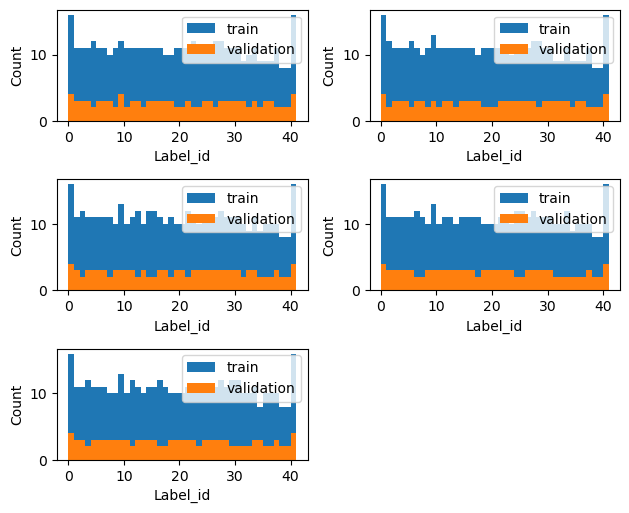

In [107]:
n= 0
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=320)

for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    X_train, y_train = get_Xy(train_index)
    X_val, y_val = get_Xy(val_index)
    n += 1
    print('Train test', n, 'has', X_train.shape ,'no of entries.')
    plt.tight_layout()
    plt.subplot(3, 2, n)
    plt.hist(y_train, label="train", bins = num_classes-1)
    plt.hist(y_val, label="validation", bins = num_classes-1)
    plt.ylabel('Count')
    plt.xlabel('Label_id')
    plt.legend(loc=1)

In [141]:
fold = 0
best_fold = -1
val_best = []
best_f1 = -1
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    model.load_weights(f"weights-fine-drop-{fold}.hdf5")
    X_val, y_val = get_Xy_ds(val_index)
    y_val_pred = model.predict(X_val)
    y_val_pred = np.argmax(y_val_pred,axis = 1)
    f1 = f1_score(y_val_pred, y_val, average = "macro")
    if f1 > best_f1:
        best_f1 = f1
        best_fold = fold
        val_best = val_index
    print(f"Fold {fold} has a F1-score of", f1)
    
    fold +=1

print(f"Fold {best_fold} has the highest F1-score of", best_f1)

7/7 [==============================] - 2s 332ms/step
Fold 0 has a F1-score of 0.9152494331065758
7/7 [==============================] - 2s 330ms/step
Fold 1 has a F1-score of 0.9201814058956914
7/7 [==============================] - 2s 325ms/step
Fold 2 has a F1-score of 0.9392857142857144
7/7 [==============================] - 2s 319ms/step
Fold 3 has a F1-score of 0.8962585034013606
7/7 [==============================] - 2s 323ms/step
Fold 4 has a F1-score of 0.9225056689342404
Fold 2 has the highest F1-score of 0.9392857142857144


In [142]:
X_val, y_val = get_Xy_ds(val_best)

Fold 4 demonstrated the best accuracy on validation set.

(array([4., 3., 3., 3., 2., 3., 3., 2., 3., 3., 3., 3., 3., 3., 3., 2., 2.,
        3., 3., 3., 2., 3., 2., 2., 3., 3., 3., 3., 3., 2., 3., 3., 2., 3.,
        2., 3., 3., 2., 2., 2., 2., 2.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42]),
 <BarContainer object of 42 artists>)

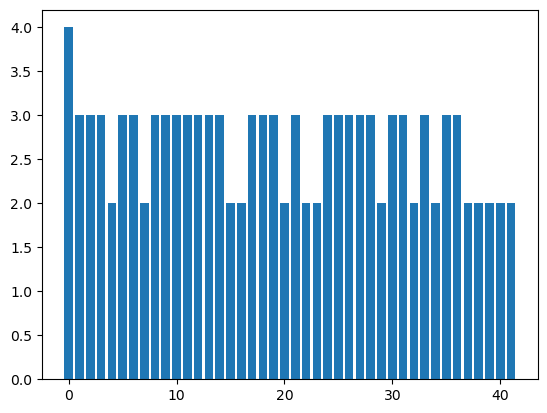

In [76]:
plt.hist(y_val, label="test", bins = bin_edges, align='left', rwidth=0.8)

In [144]:
model.load_weights(f"weights-fine-drop-{best_fold}.hdf5")

In [145]:
y_val_pred = model.predict(X_val)
y_val_pred = np.argmax(y_val_pred,axis = 1)

7/7 [==============================] - 3s 352ms/step


In [146]:
f1_score(y_val_pred, y_val, average = "macro")

0.9392857142857144

Then we will get the classification report, and see which label id are performing the worst.

In [147]:
cr = classification_report(y_val, y_val_pred, output_dict=True)
print('Macro f1 score:', f1_score(y_val, y_val_pred, average = "macro"))
cr_df = pd.DataFrame.from_dict(cr).T
cr_df

Macro f1 score: 0.9392857142857144


,precision,recall,f1-score,support
0,1.000000,1.000000,1.000000,4.000000
1,1.000000,1.000000,1.000000,3.000000
2,1.000000,1.000000,1.000000,3.000000
3,1.000000,1.000000,1.000000,3.000000
4,1.000000,1.000000,1.000000,3.000000
5,0.600000,1.000000,0.750000,3.000000
6,1.000000,0.333333,0.500000,3.000000
7,1.000000,1.000000,1.000000,3.000000
8,1.000000,1.000000,1.000000,3.000000
9,1.000000,1.000000,1.000000,3.000000


In [148]:
f1_thresold = 1
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold, val_best)

Worst performing labels with f1-scocre < 1 are: [5, 6, 11, 12, 13, 20, 26, 35, 38]
List of labels and corresponding index in data set:


,label,index
1,5,26
59,5,420
15,5,60
64,6,331
58,6,192
92,6,522
88,11,133
8,11,667
84,12,69
57,12,405


No. of images in test set  with f1-scocre < 1 22


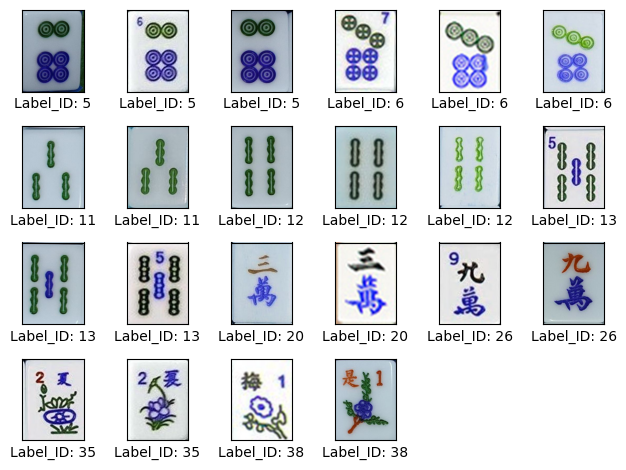

In [149]:
display_image(val_img, val_label, num_img)

## Model Prediction on test set

Now we will use the fold 3 model on our test set (indices_test).

In [66]:
indices_test

array([355,  71, 235, 697, 639, 529, 274, 518,  29,  86, 653,  84,  88,
       187,  37,  64, 481,  83, 505, 171, 603, 216, 620, 681, 493, 590,
       619, 305, 161, 174,  98, 488, 561, 548,  52,   6, 563, 160, 517,
       113,  43, 593, 660,  89,  49, 166, 347, 285, 173, 367, 440, 465,
       353, 538, 691,  66, 278,  35, 426, 340, 117, 189, 612, 428, 569,
       209, 540, 515, 253, 411, 110, 202,  25, 501, 565, 343, 699, 105,
       644, 618, 635,  68, 494, 283, 669, 418, 506, 640, 162, 108, 144,
       262, 641, 671, 284, 155, 555, 655, 622, 605, 106,   3, 599, 370,
        79,  96, 242, 638, 236, 509, 677, 417, 136, 359, 658, 503, 675,
         8, 300, 201, 336, 138, 627, 647, 357, 575,   4, 140, 313, 339,
       523, 373, 661, 238, 182, 230, 478, 304, 223, 208])

In [67]:
X_test, y_test = get_Xy_ds(indices_test)

(array([5., 3., 3., 3., 3., 3., 4., 3., 3., 4., 3., 4., 4., 3., 3., 4., 3.,
        3., 3., 3., 3., 3., 3., 4., 4., 3., 3., 4., 4., 4., 4., 3., 3., 4.,
        3., 3., 3., 3., 3., 3., 3., 3.]),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42]),
 <BarContainer object of 42 artists>)

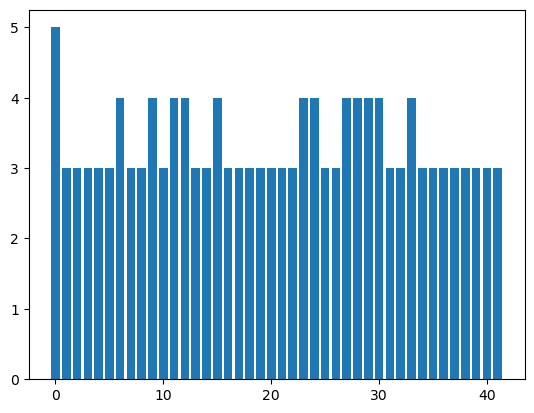

In [91]:
#Confirm the stratified k-fold and get_Xy_ds worked on test set
plt.hist(y_test, label="test", bins = bin_edges, align='left', rwidth=0.8)

In [93]:
#Load best model weights(fold 3) and get f1 score
model.load_weights(f"weights-fine-drop-3.hdf5")
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred,axis = 1)
f1 = f1_score(y_pred, y_test, average = "macro")
print(f"Fold 3 has a F1-score of", f1, "on test set")

9/9 [==============================] - 3s 312ms/step
Fold 3 has a F1-score of 0.9297430083144369 on test set


Let's see if the model is working fine on the test set.

In [94]:
test_cr = classification_report(y_test, y_pred,output_dict=True)
print('Macro f1 score:', f1_score(y_test, y_pred, average = "macro"))
cr_df = pd.DataFrame.from_dict(test_cr).T
cr_df

Macro f1 score: 0.9297430083144369


,precision,recall,f1-score,support
0,1.000000,1.000000,1.000000,5.000000
1,1.000000,1.000000,1.000000,3.000000
2,1.000000,1.000000,1.000000,3.000000
3,1.000000,1.000000,1.000000,3.000000
4,1.000000,1.000000,1.000000,3.000000
5,1.000000,0.666667,0.800000,3.000000
6,0.800000,1.000000,0.888889,4.000000
7,1.000000,1.000000,1.000000,3.000000
8,1.000000,1.000000,1.000000,3.000000
9,0.750000,0.750000,0.750000,4.000000


In [95]:
f1_thresold = 0.8
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold, val_best)

Worst performing labels with f1-scocre < 0.8 are: [9, 34, 36, 41]
List of labels and corresponding index in data set:


,label,index
50,9,643
58,9,452
92,9,539
26,34,210
61,34,589
45,36,685
97,36,466
111,36,587
15,41,682
88,41,148


No. of images in test set  with f1-scocre < 0.8 10


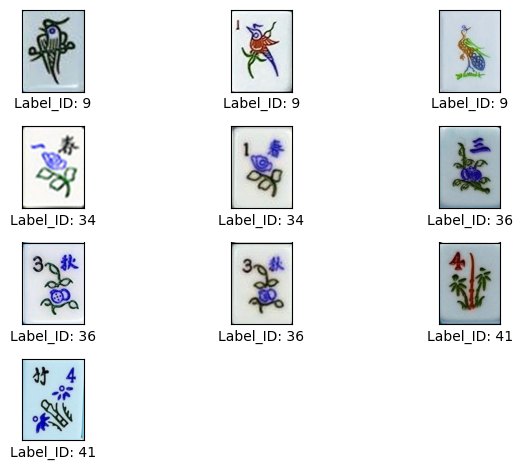

In [96]:
display_image(val_img, val_label, num_img)

## Conclusion

The tuned Mobilenet_V2 model with trained output layer of GlobalAveragePooling2D demonstrated its ability to classify mahjong class, with accuracy ~0.93 on test set. The image dataset has a relatively small size of 700 images and 42 classes, which could lead to insufficient data for training, even with data augmentation. It is noticed that label 9, 34-41 varies significantly between tiles, which may have led to the inaccurate predictions. In fact, all labels with f1-score <0.8 in test set are all from the above mentioned labels.

Data augmentation and base model training has solved the overfitting problem, and significantly improved model accuracy. 
To further improved the accuracy of model, a larger data set, especially on honours (label 34-41) shall be required.